In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.offline as pyo
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_classification
from sklearn.svm import SVC
from scipy.stats import loguniform
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, \
                            classification_report, confusion_matrix, cohen_kappa_score, \
                            hamming_loss
import warnings
warnings.filterwarnings("ignore")
pyo.init_notebook_mode()

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns
import optuna
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

from hyperopt import hp, fmin, tpe, Trials, STATUS_OK, space_eval
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import numpy as np

In [2]:
spotify = pd.read_csv("songs_normalize.csv",encoding='latin-1')
spotify.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160,False,2000,77,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop
1,blink-182,All The Small Things,167066,False,1999,79,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726,"rock, pop"
2,Faith Hill,Breathe,250546,False,1999,66,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859,"pop, country"
3,Bon Jovi,It's My Life,224493,False,2000,78,0.551,0.913,0,-4.063,0,0.0466,0.0263,0.000013,0.3470,0.544,119.992,"rock, metal"
4,*NSYNC,Bye Bye Bye,200560,False,2000,65,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop


In [3]:
# https://www.kaggle.com/datasets/leonardopena/top-spotify-songs-from-20102019-by-year

In [4]:
spotify.info

<bound method DataFrame.info of               artist                                    song  duration_ms  \
0     Britney Spears                  Oops!...I Did It Again       211160   
1          blink-182                    All The Small Things       167066   
2         Faith Hill                                 Breathe       250546   
3           Bon Jovi                            It's My Life       224493   
4             *NSYNC                             Bye Bye Bye       200560   
...              ...                                     ...          ...   
1995  Jonas Brothers                                  Sucker       181026   
1996    Taylor Swift                            Cruel Summer       178426   
1997    Blanco Brown                              The Git Up       200593   
1998       Sam Smith  Dancing With A Stranger (with Normani)       171029   
1999     Post Malone                                 Circles       215280   

      explicit  year  popularity  danceabil

In [5]:
spotify.shape

(2000, 18)

In [6]:
spotify.columns

Index(['artist', 'song', 'duration_ms', 'explicit', 'year', 'popularity',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'genre'],
      dtype='object')

In [7]:
print(spotify.isnull().sum())

print(spotify.describe())

artist              0
song                0
duration_ms         0
explicit            0
year                0
popularity          0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
genre               0
dtype: int64
         duration_ms        year   popularity  danceability       energy  \
count    2000.000000  2000.00000  2000.000000   2000.000000  2000.000000   
mean   228748.124500  2009.49400    59.872500      0.667438     0.720366   
std     39136.569008     5.85996    21.335577      0.140416     0.152745   
min    113000.000000  1998.00000     0.000000      0.129000     0.054900   
25%    203580.000000  2004.00000    56.000000      0.581000     0.622000   
50%    223279.500000  2010.00000    65.500000      0.676000     0.736000   
75%    248133.000000  2015.00000    73.000000      0.764000

In [8]:
spotify = spotify.drop_duplicates()

if spotify['explicit'].all() == False:
    spotify = spotify.drop(columns=['explicit'])

print(spotify)

              artist                                    song  duration_ms  \
0     Britney Spears                  Oops!...I Did It Again       211160   
1          blink-182                    All The Small Things       167066   
2         Faith Hill                                 Breathe       250546   
3           Bon Jovi                            It's My Life       224493   
4             *NSYNC                             Bye Bye Bye       200560   
...              ...                                     ...          ...   
1995  Jonas Brothers                                  Sucker       181026   
1996    Taylor Swift                            Cruel Summer       178426   
1997    Blanco Brown                              The Git Up       200593   
1998       Sam Smith  Dancing With A Stranger (with Normani)       171029   
1999     Post Malone                                 Circles       215280   

      year  popularity  danceability  energy  key  loudness  mode  \
0     

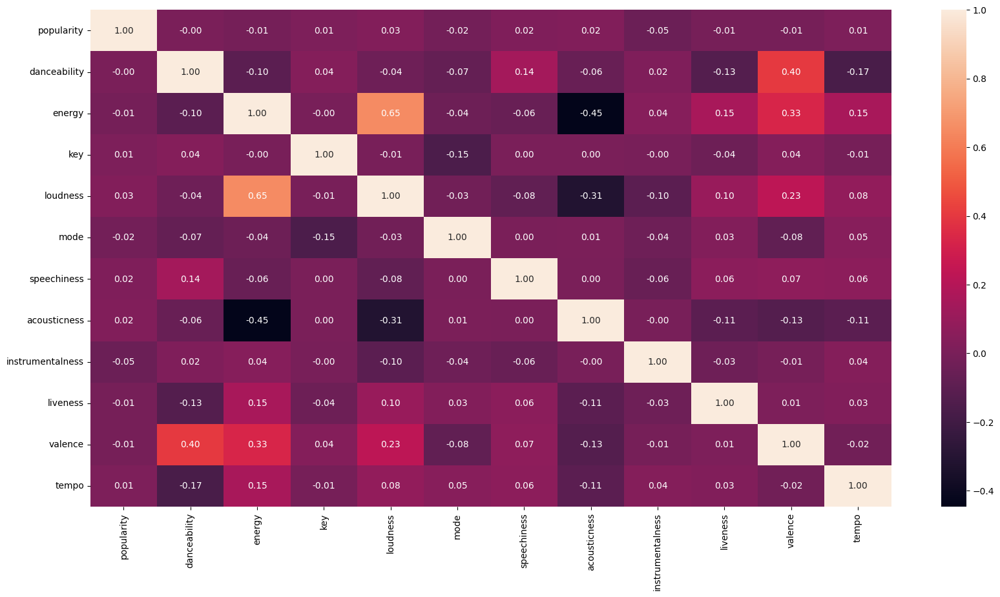

In [9]:
spotify_numeric = spotify.select_dtypes(include=['number']).drop(columns=['year', 'duration_ms'])

plt.figure(figsize=(20,10))
sns.heatmap(spotify_numeric.corr(), annot=True, fmt='.2f')
plt.show()

In [10]:
top_10_songs_by_streams = spotify.filter(items = ['song','popularity'], axis = 1)
top_10_songs_by_streams = top_10_songs_by_streams.sort_values(by = 'popularity',ascending = False).head(10)
top_10_songs_by_streams

,song,popularity
1322,Sweater Weather,89
1311,Another Love,88
201,Without Me,87
1819,lovely (with Khalid),86
1613,Wait a Minute!,86
6,The Real Slim Shady,86
1514,The Nights,85
1512,Daddy Issues,85
1709,Perfect,85
1999,Circles,85


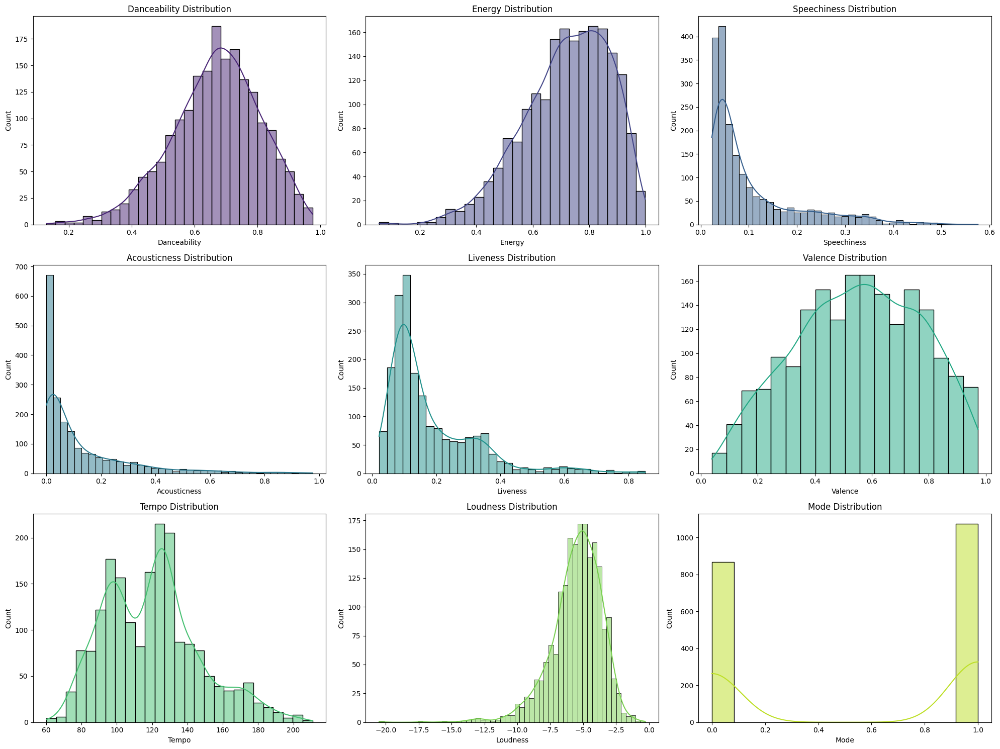

In [140]:
features = ['danceability', 'energy', 'speechiness', 'acousticness', 'liveness', 'valence', 'tempo', 'loudness', 'mode']


colors = sns.color_palette("viridis", len(features))


num_cols = 3

num_rows = (len(features) + num_cols - 1) // num_cols

fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

for i, feature in enumerate(features):
    row = i // num_cols
    col = i % num_cols
    sns.histplot(spotify[feature], kde=True, color=colors[i], ax=axs[row, col])
    axs[row, col].set_title(f'{feature.capitalize()} Distribution')
    axs[row, col].set_xlabel(feature.capitalize())
    axs[row, col].set_ylabel('Count')

for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axs.flatten()[j])

plt.tight_layout()
plt.show()

In [142]:
fig.savefig('features_distribution.png', dpi=300)


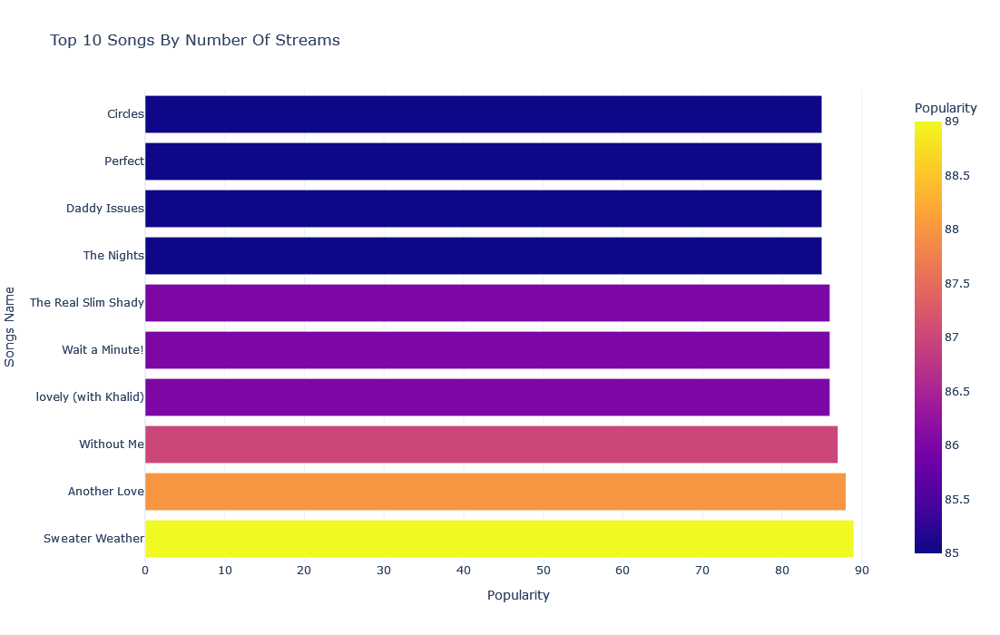

In [11]:
top_10_songs_by_streams_v = px.bar(top_10_songs_by_streams, 
                                   y='song', 
                                   x='popularity',
                                   template='plotly_white',
                                   width=1200, 
                                   height=700,
                                   color='popularity',
                                   title='Top 10 Songs By Number Of Streams',
                                   labels={'song': 'Songs Name', 'popularity': 'Popularity'})
top_10_songs_by_streams_v.show()

In [12]:
top_10_artist_by_streams = spotify.filter(items = ['artist','popularity'], axis = 1)
top_10_artist_by_streams =top_10_artist_by_streams.groupby(['artist'])['popularity'].sum().sort_values(ascending =False).to_frame().head(10)
top_10_artist_by_streams.reset_index(inplace = True)
top_10_artist_by_streams

,artist,popularity
0,Rihanna,1662
1,Eminem,1519
2,Drake,1424
3,Calvin Harris,1356
4,Britney Spears,1198
5,David Guetta,1185
6,Taylor Swift,1125
7,Katy Perry,1033
8,BeyoncÃ©,1030
9,Chris Brown,1012


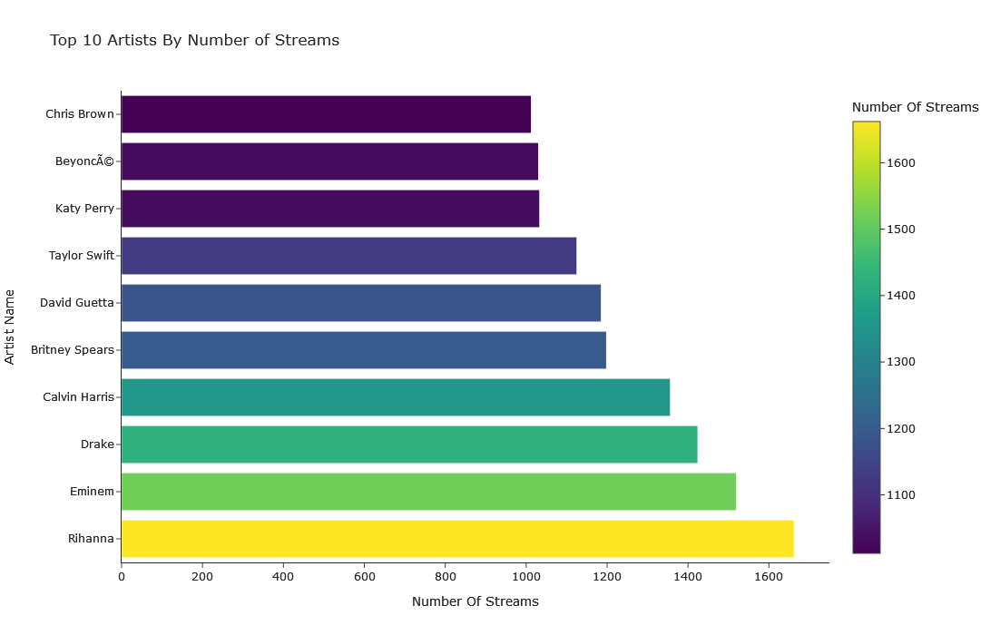

In [13]:
top_10_artist_by_streams_v = px.bar(top_10_artist_by_streams,y= 'artist', x = 'popularity',template = 'simple_white',width = 1200, height = 700,
                                    color = 'popularity',title = 'Top 10 Artists By Number of Streams',labels = {'artist': 'Artist Name',
                                        'popularity': 'Number Of Streams'})
top_10_artist_by_streams_v

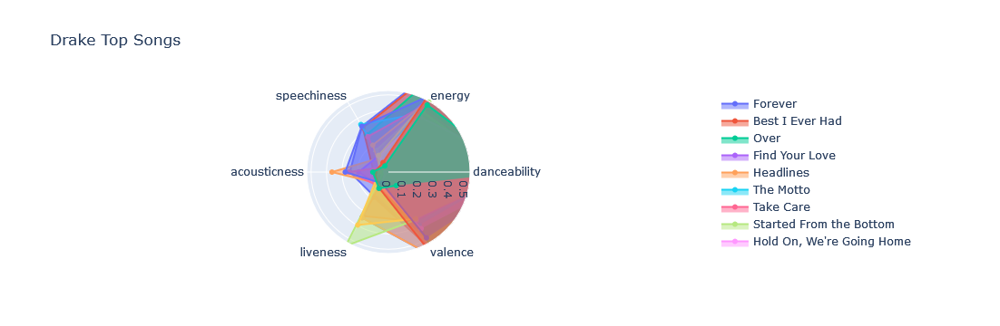

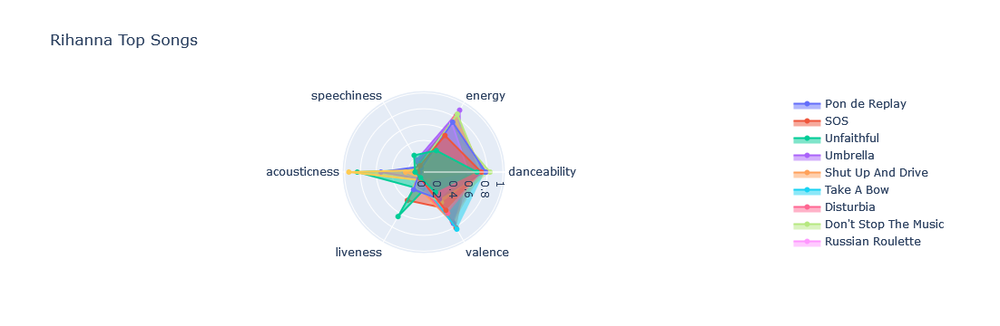

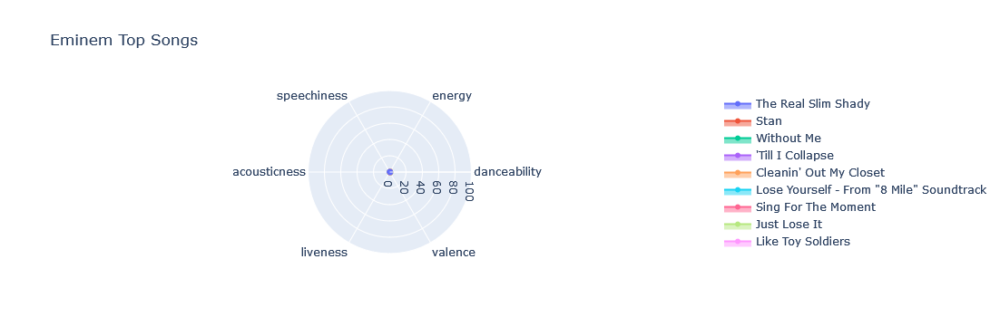

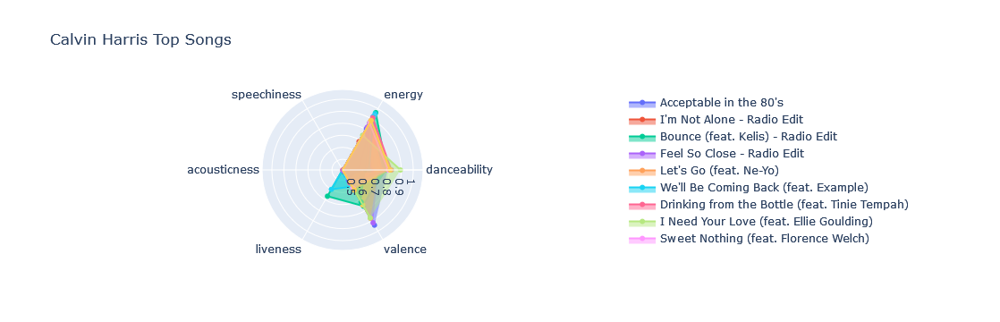

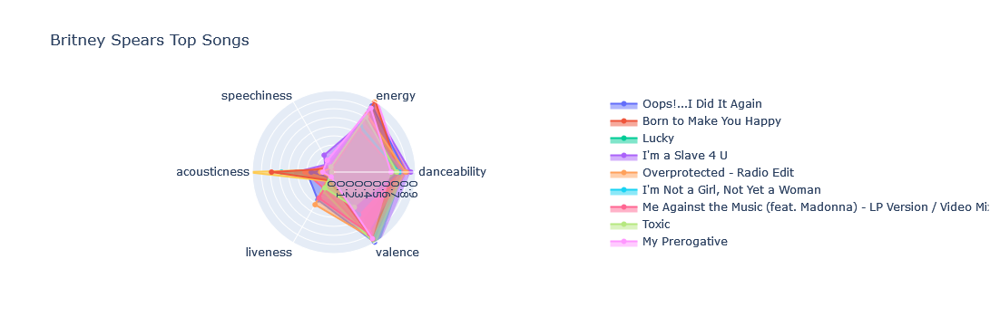

In [54]:
def create_radar_chart(artist_name, spotify_data):
    artist_songs = spotify_data[spotify_data['artist'] == artist_name]
    categories = ['danceability', 'energy', 'speechiness', 'acousticness', 'liveness', 'valence']
    fig = go.Figure()

    for song in artist_songs['song']:
        fig.add_trace(go.Scatterpolar(
            r=artist_songs[artist_songs['song'] == song][categories].values.flatten().tolist(),
            theta=categories,
            fill='toself',
            name=song
        ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, 100]
            )),
        showlegend=True,
        title=f"{artist_name} Top Songs"
    )
    return fig


top_5_artists = spotify['artist'].value_counts().head(5).index

    fig = create_radar_chart(artist, spotify)
    fig.show()

In [45]:
# train-test split and model training


In [10]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
def map_genre(genre):
    genre_list = [g.strip().lower() for g in genre.split(',')]
    if 'pop' in genre_list:
        return 'pop'
    elif 'hip hop' in genre_list:
        return 'hip hop'
    elif 'rock' in genre_list:
        return 'rock'
    elif 'r&b' in genre_list:
        return 'R&B'
    else:
        return 'Other'

spotify['genre_class'] = spotify['genre'].apply(map_genre)

label_encoder = LabelEncoder()
spotify['genre_class'] = label_encoder.fit_transform(spotify['genre_class'])

X = spotify.drop(['genre', 'genre_class', 'artist', 'song','year','popularity','duration_ms'], axis=1)  
y = spotify['genre_class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


# XGBClassifier

In [72]:
model_xgb = XGBClassifier()
model_xgb.fit(X_train_scaled, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [74]:
y_pred_xgb = model_xgb.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred_xgb)
print(f"Accuracy: {accuracy}")

Accuracy: 0.8354755784061697


In [160]:
explainer = shap.Explainer(model_xgb, X_train_scaled)
shap_values = explainer(X_train_scaled)


shap_values_abs = np.abs(shap_values.values).mean(axis=(0, 2))

feature_names = X.columns
feature_importance = pd.DataFrame(list(zip(feature_names, shap_values_abs)), columns=['Feature', 'SHAP Value'])

print("SHAP Values Shape:", shap_values.values.shape)
print("Feature Importance Shape:", feature_importance.shape)

feature_importance = feature_importance.sort_values(by='SHAP Value', ascending=False)

top_features = feature_importance.head(5)

print("Top 5 features based on SHAP values:")
print(top_features)


top_feature_names = top_features['Feature'].tolist()
X_train_scaled_top = X_train_scaled[:, feature_names.get_indexer(top_feature_names)]
shap_values_top = explainer(X_train_scaled_top)

# Tworzenie wykresu SHAP tylko dla 5 najważniejszych cech
shap.summary_plot(shap_values_top.values, X_train_scaled_top, feature_names=top_feature_names, plot_type="bar")


100%|===================| 7759/7760 [01:55<00:00]        

SHAP Values Shape: (1552, 11, 5)
Feature Importance Shape: (11, 2)
Top 5 features based on SHAP values:
        Feature  SHAP Value
5   speechiness    0.470806
0  danceability    0.447369
6  acousticness    0.320021
1        energy    0.310999
8      liveness    0.287130


 99%|===================| 7710/7760 [02:09<00:00]        

ExplainerError: Additivity check failed in TreeExplainer! Please ensure the data matrix you passed to the explainer is the same shape that the model was trained on. If your data shape is correct then please report this on GitHub. This check failed because for one of the samples the sum of the SHAP values was -0.918892, while the model output was 2.841292. If this difference is acceptable you can set check_additivity=False to disable this check.

## SHAP bez wykorzystania metod optymalizacji hiperparametrów

              precision    recall  f1-score   support

       Other       0.50      0.08      0.13        13
         R&B       0.00      0.00      0.00         5
     hip hop       0.33      0.04      0.07        25
         pop       0.84      0.99      0.91       324
        rock       1.00      0.05      0.09        22

    accuracy                           0.84       389
   macro avg       0.53      0.23      0.24       389
weighted avg       0.79      0.84      0.77       389



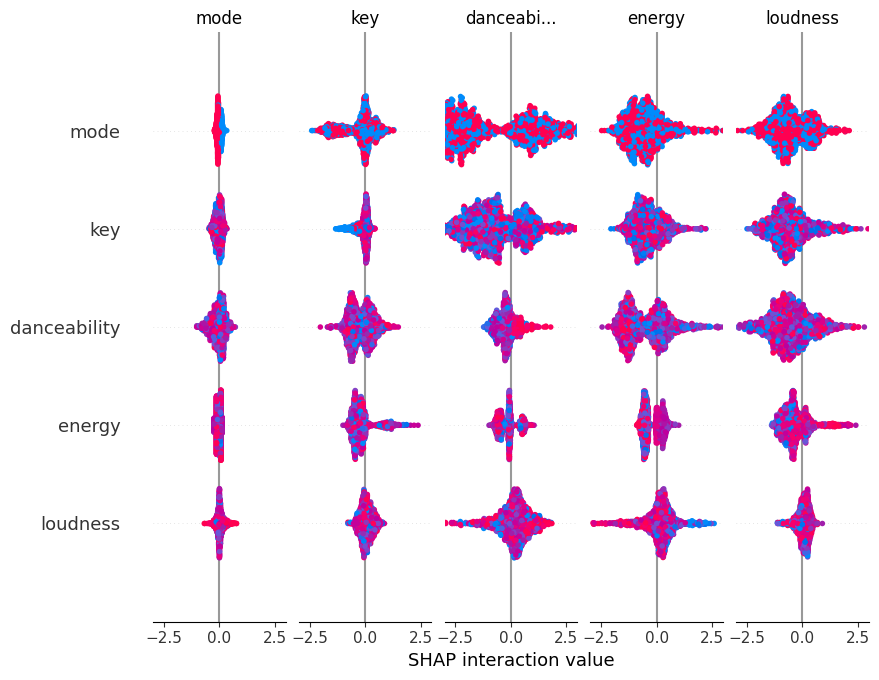

In [115]:
import shap
import matplotlib.pyplot as plt

model_xgb = XGBClassifier()

model_xgb.fit(X_train_scaled, y_train)

y_pred = model_xgb.predict(X_test_scaled)


y_pred_labels = label_encoder.inverse_transform(y_pred)
y_test_labels = label_encoder.inverse_transform(y_test)


print(classification_report(y_test_labels, y_pred_labels))

explainer = shap.TreeExplainer(model_xgb)
shap_values = explainer.shap_values(X_train_scaled)

shap.summary_plot(shap_values, X_train_scaled, feature_names=X.columns, plot_type="bar")

In [57]:
# Obliczanie ważności cech za pomocą feature_importances_
importances = model_xgb.feature_importances_
feature_labels = X.columns

# Tworzenie listy z indeksami, nazwami cech i ich ważnością
feature_importances = [(idx, feature, round(importance, 3)) for idx, feature, importance in zip(range(feature_labels.shape[0]), feature_labels, importances)]

# Sortowanie cech według ważności malejąco
feature_importances = sorted(feature_importances, key=lambda x: x[-1], reverse=True)

# Wypisanie ważności cech
for idx, feature, importance in feature_importances:
    print(f"Variable {idx}: {feature:<20} Importance: {importance}")

Variable 0: danceability         Importance: 0.11599999666213989
Variable 7: instrumentalness     Importance: 0.11500000208616257
Variable 5: speechiness          Importance: 0.11100000143051147
Variable 1: energy               Importance: 0.08799999952316284
Variable 3: loudness             Importance: 0.08799999952316284
Variable 6: acousticness         Importance: 0.08799999952316284
Variable 8: liveness             Importance: 0.08500000089406967
Variable 9: valence              Importance: 0.08299999684095383
Variable 10: tempo                Importance: 0.07999999821186066
Variable 4: mode                 Importance: 0.07500000298023224
Variable 2: key                  Importance: 0.0729999989271164


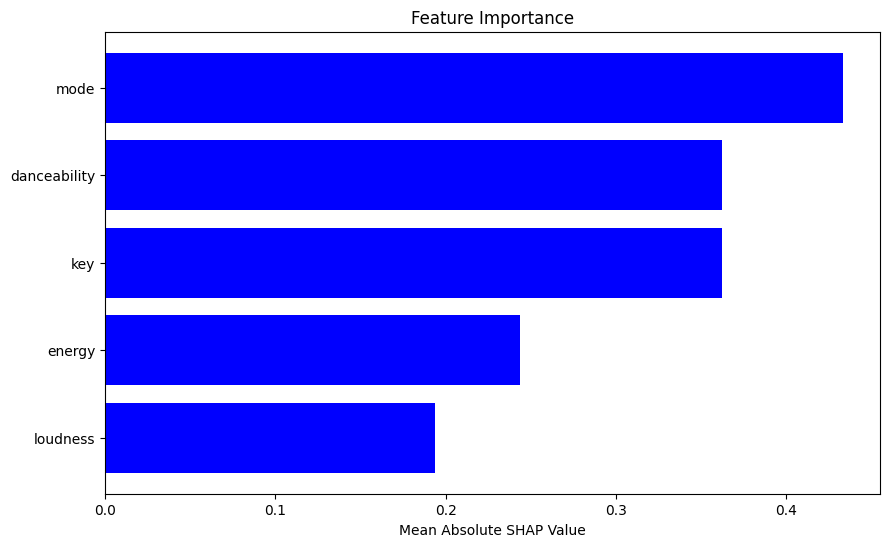

In [135]:
explainer = shap.TreeExplainer(model_xgb)
shap_values = explainer.shap_values(X_train_scaled)

shap_values_abs = np.mean(np.abs(shap_values), axis=0).mean(axis=0)

feature_importance = pd.DataFrame(list(zip(X.columns, shap_values_abs)), columns=['Feature', 'SHAP Value'])
feature_importance = feature_importance.sort_values(by='SHAP Value', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature'], feature_importance['SHAP Value'], color='blue')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance')
plt.gca().invert_yaxis()
plt.show()


# GridSearchCV dla XGBClassifier

In [67]:
param_grid = {
    'learning_rate': [0.1, 0.01],
    'n_estimators': [50, 100, 150],
    'max_depth': [4, 6],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'subsample': [0.7, 0.8, 0.9],
    'min_child_weight': [1, 5, 10]
}

model_Grid = GridSearchCV(
    estimator=XGBClassifier(),
    param_grid=param_grid,
    cv=3,
    n_jobs=-1,
    scoring='accuracy'
)

model_Grid.fit(X_train_scaled, y_train)

best_model_Grid = model_Grid.best_estimator_
y_pred_Grid = best_model_Grid.predict(X_test_scaled)

# Print best model parameters and accuracy
print("Best Model Parameters:", model_Grid.best_params_)
print("Accuracy:", accuracy_score(y_test, y_pred_Grid))
print("Classification Report:")
print(classification_report(y_test, y_pred_Grid))


Best Model Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 150, 'subsample': 0.9}
Accuracy: 0.8329048843187661
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.00      0.00      0.00         5
           2       0.00      0.00      0.00        25
           3       0.83      1.00      0.91       324
           4       0.00      0.00      0.00        22

    accuracy                           0.83       389
   macro avg       0.17      0.20      0.18       389
weighted avg       0.69      0.83      0.76       389



## SHAP z wykorzystnaniem best model Grid XGB

In [68]:
importances = best_model_Grid.feature_importances_
feature_labels = X.columns


feature_importances = [(idx, feature, round(importance, 3)) for idx, feature, importance in zip(range(feature_labels.shape[0]), feature_labels, importances)]

# Sortowanie cech według ważności malejąco
feature_importances = sorted(feature_importances, key=lambda x: x[-1], reverse=True)

# Wypisanie ważności cech
for idx, feature, importance in feature_importances:
    print(f"Variable {idx}: {feature:<20} Importance: {importance}")

Variable 0: danceability         Importance: 0.12399999797344208
Variable 5: speechiness          Importance: 0.11400000005960464
Variable 7: instrumentalness     Importance: 0.10199999809265137
Variable 6: acousticness         Importance: 0.09799999743700027
Variable 1: energy               Importance: 0.09200000017881393
Variable 3: loudness             Importance: 0.08900000154972076
Variable 9: valence              Importance: 0.08500000089406967
Variable 8: liveness             Importance: 0.07900000363588333
Variable 10: tempo                Importance: 0.07599999755620956
Variable 4: mode                 Importance: 0.0729999989271164
Variable 2: key                  Importance: 0.06800000369548798


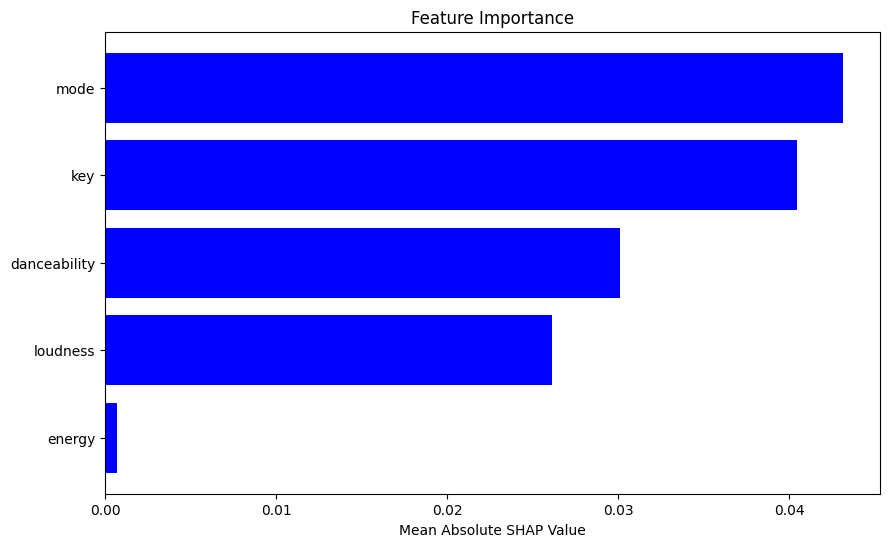

In [140]:
shap_values_abs = np.mean(np.abs(shap_values), axis=0).mean(axis=0)

feature_importance = pd.DataFrame(list(zip(X.columns, shap_values_abs)), columns=['Feature', 'SHAP Value'])
feature_importance = feature_importance.sort_values(by='SHAP Value', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature'], feature_importance['SHAP Value'], color='blue')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance')
plt.gca().invert_yaxis()
plt.show()


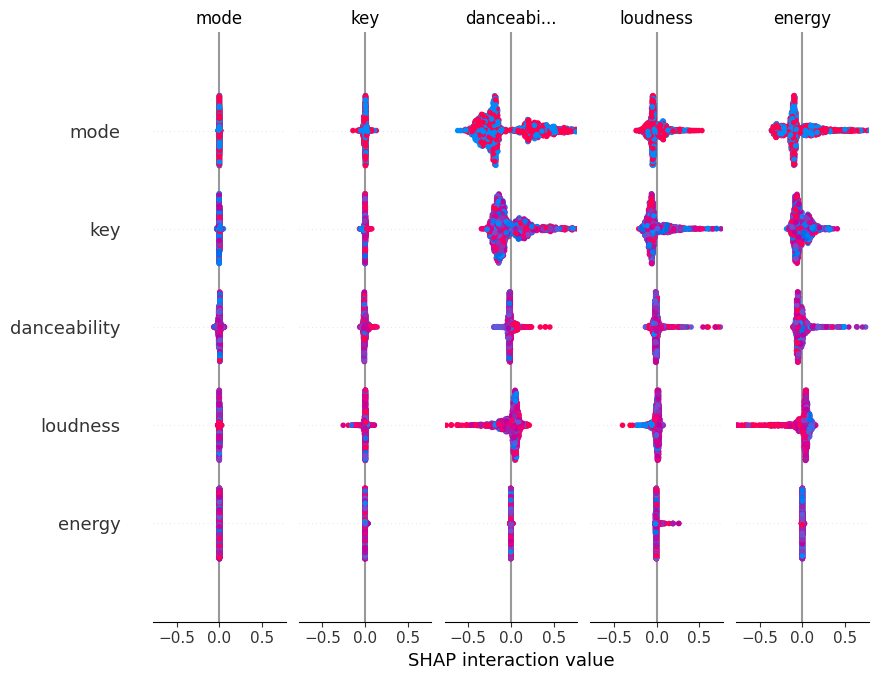

In [144]:
explainer = shap.TreeExplainer(best_model_Grid)
shap_values = explainer.shap_values(X_train_scaled)  
shap.summary_plot(shap_values, X_train_scaled, feature_names=X.columns)

## Optuna dla XGBClassifier

In [33]:
def objective(trial):
    params = {
        'booster': trial.suggest_categorical('booster', ['gbtree', 'dart']),
        'lambda': trial.suggest_loguniform('lambda', 1e-3, 10.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-3, 10.0),
        'subsample': trial.suggest_categorical('subsample', [0.5, 0.7, 1.0]),
        'colsample_bytree': trial.suggest_categorical('colsample_bytree', [0.5, 0.7, 1.0]),
        'max_depth': trial.suggest_int('max_depth', 3, 9),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 9),
        'eta': trial.suggest_loguniform('eta', 0.01, 0.1),
        'n_estimators': 100,
        'objective': 'binary:logistic'
    }

    model_Optuna = XGBClassifier(**params)
    scores = cross_val_score(model_Optuna, X_train_scaled, y_train, cv=5, scoring='accuracy')
    return scores.mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print('Best trial:', study.best_trial.params)

best_params = study.best_trial.params
best_model_Optuna = XGBClassifier(**best_params)
best_model_Optuna.fit(X_train_scaled, y_train)
y_pred_Optuna = best_model_Optuna.predict(X_test_scaled)

accuracy_test = accuracy_score(y_test, y_pred_Optuna)
print("Dokładność na zbiorze testowym:", accuracy_test)

[I 2024-06-03 09:30:15,350] A new study created in memory with name: no-name-cd5ef1d7-6dd6-4f9f-b44d-01fed3c210d4
[I 2024-06-03 09:30:18,763] Trial 0 finished with value: 0.8112146042941604 and parameters: {'booster': 'gbtree', 'lambda': 0.1263503952365814, 'alpha': 2.8460821310849784, 'subsample': 0.7, 'colsample_bytree': 0.5, 'max_depth': 5, 'min_child_weight': 8, 'eta': 0.050611411991028143}. Best is trial 0 with value: 0.8112146042941604.
[I 2024-06-03 09:30:23,052] Trial 1 finished with value: 0.8105715174774402 and parameters: {'booster': 'gbtree', 'lambda': 0.16961190431630566, 'alpha': 0.11740613667253855, 'subsample': 0.5, 'colsample_bytree': 0.5, 'max_depth': 5, 'min_child_weight': 3, 'eta': 0.08070284693376713}. Best is trial 0 with value: 0.8112146042941604.
[I 2024-06-03 09:31:28,697] Trial 2 finished with value: 0.8079867233689452 and parameters: {'booster': 'dart', 'lambda': 0.015770626009898744, 'alpha': 0.015542638990123953, 'subsample': 0.5, 'colsample_bytree': 1.0, '

Best trial: {'booster': 'dart', 'lambda': 8.124133285228124, 'alpha': 0.0011314277040708012, 'subsample': 0.7, 'colsample_bytree': 0.7, 'max_depth': 9, 'min_child_weight': 1, 'eta': 0.09899075629340384}
Dokładność na zbiorze testowym: 0.8303341902313625


In [34]:
print("Classification Report:")
print(classification_report(y_test, y_pred_Optuna))

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.00      0.00      0.00         5
           2       0.00      0.00      0.00        25
           3       0.83      1.00      0.91       324
           4       0.00      0.00      0.00        22

    accuracy                           0.83       389
   macro avg       0.17      0.20      0.18       389
weighted avg       0.69      0.83      0.76       389



## SHAP z wykorzystnaniem Optiuna XGB

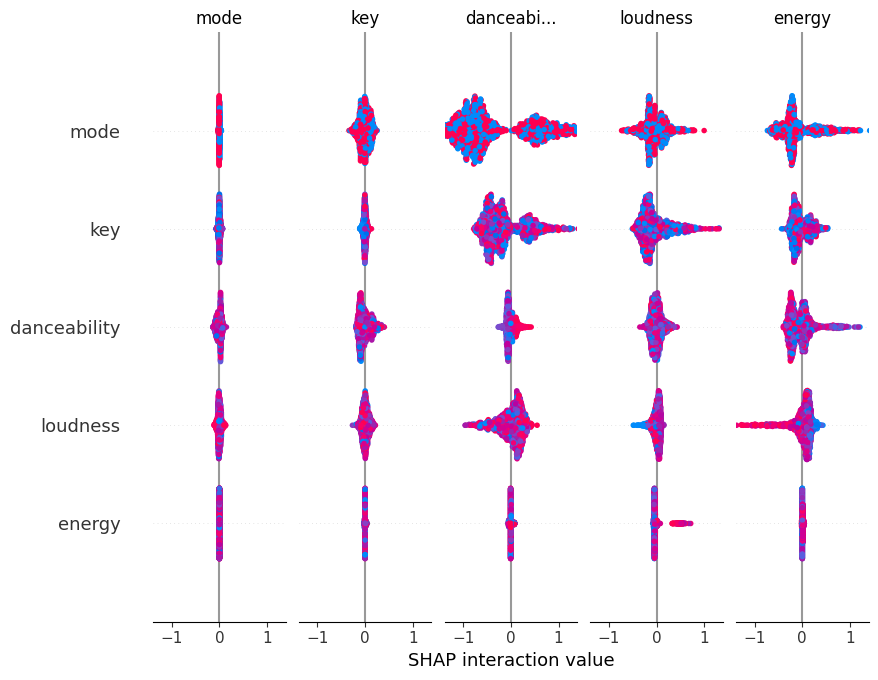

In [176]:
explainer = shap.TreeExplainer(best_model_Optuna.get_booster())
shap_values = explainer.shap_values(X_train_scaled)
shap.summary_plot(shap_values, X_train_scaled, feature_names=X.columns, plot_type="bar")

In [65]:
# Obliczanie ważności cech za pomocą feature_importances_
importances = best_model_Optuna.feature_importances_
feature_labels = X.columns

# Tworzenie listy z indeksami, nazwami cech i ich ważnością
feature_importances = [(idx, feature, round(importance, 3)) for idx, feature, importance in zip(range(feature_labels.shape[0]), feature_labels, importances)]

# Sortowanie cech według ważności malejąco
feature_importances = sorted(feature_importances, key=lambda x: x[-1], reverse=True)

# Wypisanie ważności cech
for idx, feature, importance in feature_importances:
    print(f"Variable {idx}: {feature:<20} Importance: {importance}")

Variable 5: speechiness          Importance: 0.1120000034570694
Variable 0: danceability         Importance: 0.11100000143051147
Variable 7: instrumentalness     Importance: 0.10499999672174454
Variable 6: acousticness         Importance: 0.09600000083446503
Variable 3: loudness             Importance: 0.08900000154972076
Variable 1: energy               Importance: 0.08699999749660492
Variable 9: valence              Importance: 0.0820000022649765
Variable 10: tempo                Importance: 0.08100000023841858
Variable 8: liveness             Importance: 0.07999999821186066
Variable 4: mode                 Importance: 0.07900000363588333
Variable 2: key                  Importance: 0.07699999958276749


## Hyperopt dla XGBClassifier

In [154]:
space = {
    'booster': hp.choice('booster', ['gbtree', 'dart']),
    'lambda': hp.loguniform('lambda', np.log(0.001), np.log(1)),
    'alpha': hp.loguniform('alpha', np.log(0.001), np.log(1)),
    'subsample': hp.choice('subsample', [0.5, 0.7, 1.0]),
    'colsample_bytree': hp.choice('colsample_bytree', [0.5, 0.7, 1.0]),
    'max_depth': hp.randint('max_depth', 3, 10),
    'min_child_weight': hp.randint('min_child_weight', 1, 10),
    'eta': hp.loguniform('eta', np.log(0.01), np.log(0.1)),
    'n_estimators': 100
}

def objective(params):
    model_Hyperopt = XGBClassifier(**params)
    score = cross_val_score(model_Hyperopt, X_train_scaled, y_train, cv=5, scoring='accuracy')
    return {'loss': -score.mean(), 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=100, trials=trials)
best_params = space_eval(space, best)  
print('Best parameters:', best_params)


best_model_Hyperopt = XGBClassifier(**best_params)
best_model_Hyperopt.fit(X_train_scaled, y_train)
y_pred_Hyperopt = best_model_Hyperopt.predict(X_test_scaled)

accuracy_test = accuracy_score(y_test, y_pred_Hyperopt)
print("Accuracy:", accuracy_test)
print("Classification Report:")
print(classification_report(y_test, y_pred_Hyperopt))


100%|██████████| 100/100 [50:03<00:00, 30.04s/trial, best loss: -0.8157224354320093]
Best parameters: {'alpha': 0.001844948066047758, 'booster': 'dart', 'colsample_bytree': 1.0, 'eta': 0.029566337452130127, 'lambda': 0.004162749791815503, 'max_depth': 7, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.5}
Accuracy: 0.8303341902313625
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.00      0.00      0.00         5
           2       0.00      0.00      0.00        25
           3       0.83      1.00      0.91       324
           4       0.00      0.00      0.00        22

    accuracy                           0.83       389
   macro avg       0.17      0.20      0.18       389
weighted avg       0.69      0.83      0.76       389



In [69]:
space = {
    'booster': hp.choice('booster', ['gbtree', 'dart']),
    'lambda': hp.loguniform('lambda', np.log(0.001), np.log(1)),
    'alpha': hp.loguniform('alpha', np.log(0.001), np.log(1)),
    'subsample': hp.choice('subsample', [0.5, 0.7, 1.0]),
    'colsample_bytree': hp.choice('colsample_bytree', [0.5, 0.7, 1.0]),
    'max_depth': hp.randint('max_depth', 3, 10),
    'min_child_weight': hp.randint('min_child_weight', 1, 10),
    'eta': hp.loguniform('eta', np.log(0.01), np.log(0.1)),
    'n_estimators': 100
}

def objective(params):
    model_Hyperopt = XGBClassifier(**params)
    score = cross_val_score(model_Hyperopt, X_train_scaled, y_train, cv=5, scoring='accuracy')
    return {'loss': -score.mean(), 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=100, trials=trials)
best_params = space_eval(space, best)  
print('Best parameters:', best_params)


best_model_Hyperopt = XGBClassifier(**best_params)
best_model_Hyperopt.fit(X_train_scaled, y_train)
y_pred_Hyperopt = best_model_Hyperopt.predict(X_test_scaled)

accuracy_test = accuracy_score(y_test, y_pred_Hyperopt)
print("Accuracy:", accuracy_test)
print("Classification Report:")
print(classification_report(y_test, y_pred_Hyperopt))


100%|██████████| 100/100 [1:00:19<00:00, 36.20s/trial, best loss: -0.8163675967223316]
Best parameters: {'alpha': 0.04807989738193634, 'booster': 'dart', 'colsample_bytree': 0.5, 'eta': 0.06460081016298819, 'lambda': 0.9579700768473477, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 1.0}
Accuracy: 0.8354755784061697
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.00      0.00      0.00         5
           2       0.00      0.00      0.00        25
           3       0.84      1.00      0.91       324
           4       1.00      0.05      0.09        22

    accuracy                           0.84       389
   macro avg       0.37      0.21      0.20       389
weighted avg       0.75      0.84      0.76       389



In [70]:
importances = best_model_Hyperopt.feature_importances_
feature_labels = X.columns

feature_importances = [(idx, feature, round(importance, 3)) for idx, feature, importance in zip(range(feature_labels.shape[0]), feature_labels, importances)]

feature_importances = sorted(feature_importances, key=lambda x: x[-1], reverse=True)

for idx, feature, importance in feature_importances:
    print(f"Variable {idx}: {feature:<20} Importance: {importance}")

Variable 0: danceability         Importance: 0.12300000339746475
Variable 5: speechiness          Importance: 0.11500000208616257
Variable 6: acousticness         Importance: 0.10400000214576721
Variable 7: instrumentalness     Importance: 0.0989999994635582
Variable 1: energy               Importance: 0.09600000083446503
Variable 3: loudness             Importance: 0.08699999749660492
Variable 9: valence              Importance: 0.08299999684095383
Variable 10: tempo                Importance: 0.0820000022649765
Variable 8: liveness             Importance: 0.07900000363588333
Variable 2: key                  Importance: 0.06700000166893005
Variable 4: mode                 Importance: 0.06400000303983688


#  Zestawienie dla XGBClassifier 

In [182]:
from sklearn.metrics import accuracy_score
results = pd.DataFrame({
    'Model': ['XGB','GridSearchCV', 'Optuna', 'Hyperopt'],
    'Accuracy': [
        accuracy_score(y_test, y_pred_xgb),
        accuracy_score(y_test, y_pred_Grid),
        accuracy_score(y_test, y_pred_Optuna),
        accuracy_score(y_test, y_pred_Hyperopt)
        
    ]
})
print(results)

          Model  Accuracy
0           XGB  0.835476
1  GridSearchCV  0.832905
2        Optuna  0.827763
3      Hyperopt  0.830334


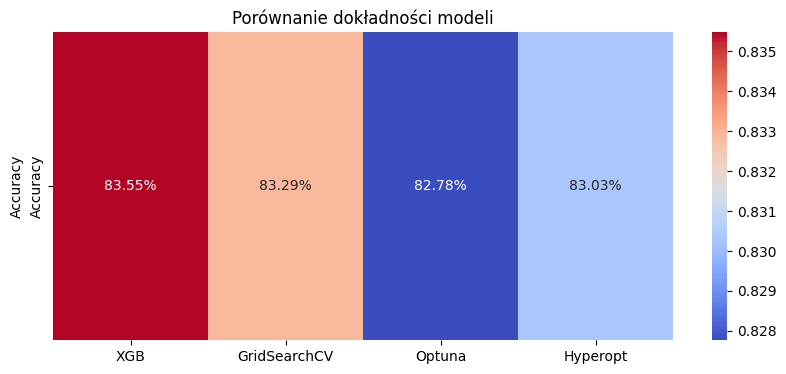

In [184]:
plt.figure(figsize=(10, 4))
sns.heatmap(results[['Accuracy']].T, annot=True, cmap='coolwarm', fmt=".2%", cbar=True, xticklabels=results['Model'])
plt.title('Porównanie dokładności modeli')
plt.ylabel('Accuracy')
plt.show()

# LGBMClassifier

In [164]:
from lightgbm import LGBMClassifier

model_lgbm = LGBMClassifier()
model_lgbm.fit(X_train_scaled, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

LGBMClassifier()

In [166]:
y_pred_lgbm = model_lgbm.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred_lgbm)
print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(classification_report(y_test, y_pred_lgbm))

Accuracy: 0.8303341902313625
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.00      0.00      0.00         5
           2       0.50      0.08      0.14        25
           3       0.84      0.99      0.91       324
           4       0.50      0.05      0.08        22

    accuracy                           0.83       389
   macro avg       0.37      0.22      0.23       389
weighted avg       0.76      0.83      0.77       389



In [168]:
explainer = shap.Explainer(model_lgbm, X_train_scaled)
shap_values = explainer(X_train_scaled)

# Obliczenie średnich absolutnych wartości SHAP dla każdej cechy
shap_values_abs = np.abs(shap_values.values).mean(axis=(0, 2))

# Użyj oryginalnych nazw kolumn z X
feature_names = X.columns

# Tworzenie DataFrame z nazwami cech i ich średnimi wartościami SHAP
feature_importance = pd.DataFrame(list(zip(feature_names, shap_values_abs)), columns=['Feature', 'SHAP Value'])

# Sprawdzenie kształtu wartości SHAP
print("SHAP Values Shape:", shap_values.values.shape)
print("Feature Importance Shape:", feature_importance.shape)

# Sortowanie cech według wartości SHAP malejąco
feature_importance = feature_importance.sort_values(by='SHAP Value', ascending=False)

# Wybór 5 najważniejszych cech
top_features = feature_importance.head(5)

# Wyświetlanie 5 najważniejszych cech
print("Top 5 features based on SHAP values:")
print(top_features)

# Filtracja shap_values i X_train_scaled tylko dla 5 najważniejszych cech
top_feature_names = top_features['Feature'].tolist()
X_train_scaled_top = X_train_scaled[:, feature_names.get_indexer(top_feature_names)]
shap_values_top = explainer(X_train_scaled_top)

# Tworzenie wykresu SHAP tylko dla 5 najważniejszych cech
shap.summary_plot(shap_values_top.values, X_train_scaled_top, feature_names=top_feature_names, plot_type="bar")


100%|===================| 7743/7760 [04:15<00:00]        

SHAP Values Shape: (1552, 11, 5)
Feature Importance Shape: (11, 2)
Top 5 features based on SHAP values:
        Feature  SHAP Value
5   speechiness    0.538698
0  danceability    0.515384
1        energy    0.387141
6  acousticness    0.382939
3      loudness    0.306245


100%|===================| 7731/7760 [03:52<00:00]        

ExplainerError: Additivity check failed in TreeExplainer! Please ensure the data matrix you passed to the explainer is the same shape that the model was trained on. If your data shape is correct then please report this on GitHub. This check failed because for one of the samples the sum of the SHAP values was -4.095870, while the model output was 0.738497. If this difference is acceptable you can set check_additivity=False to disable this check.

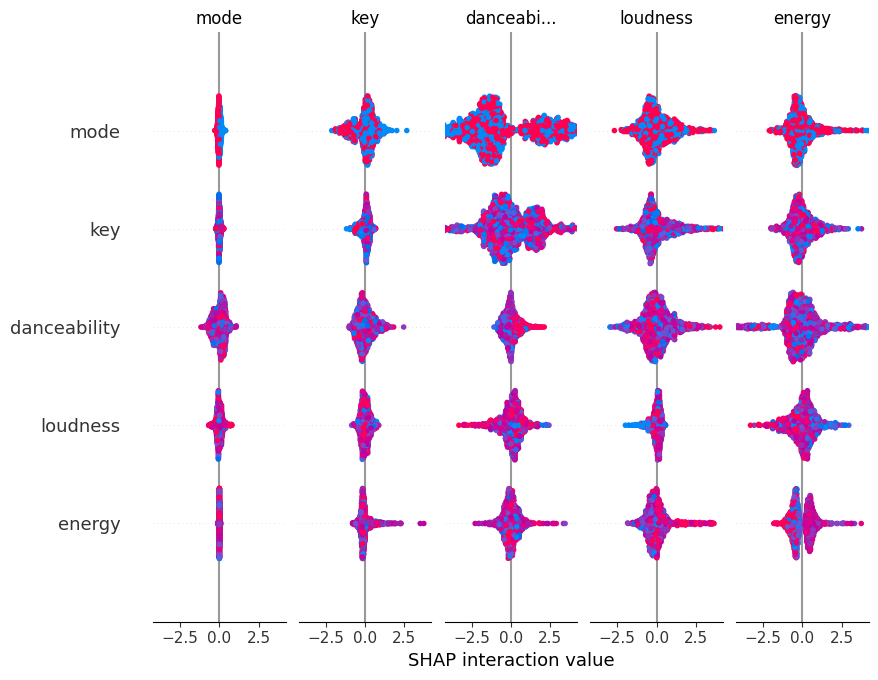

In [193]:
explainer = shap.TreeExplainer(model_lgbm)
shap_values = explainer.shap_values(X_train_scaled)
shap.summary_plot(shap_values, X_train_scaled, feature_names=X.columns, plot_type="bar")

In [87]:
importances = model_lgbm.feature_importances_
feature_labels = X.columns
total_importance = sum(importances)
normalized_importances = [importance / total_importance for importance in importances]

feature_importances = [(idx, feature, round(importance, 3)) for idx, feature, importance in zip(range(feature_labels.shape[0]), feature_labels, normalized_importances)]
feature_importances = sorted(feature_importances, key=lambda x: x[-1], reverse=True)

for idx, feature, importance in feature_importances:
    print(f"Variable {idx}: {feature:<20} Importance: {importance:.3f}")

Variable 6: acousticness         Importance: 0.126
Variable 5: speechiness          Importance: 0.121
Variable 10: tempo                Importance: 0.116
Variable 1: energy               Importance: 0.107
Variable 0: danceability         Importance: 0.105
Variable 8: liveness             Importance: 0.105
Variable 3: loudness             Importance: 0.104
Variable 9: valence              Importance: 0.096
Variable 7: instrumentalness     Importance: 0.065
Variable 2: key                  Importance: 0.045
Variable 4: mode                 Importance: 0.010


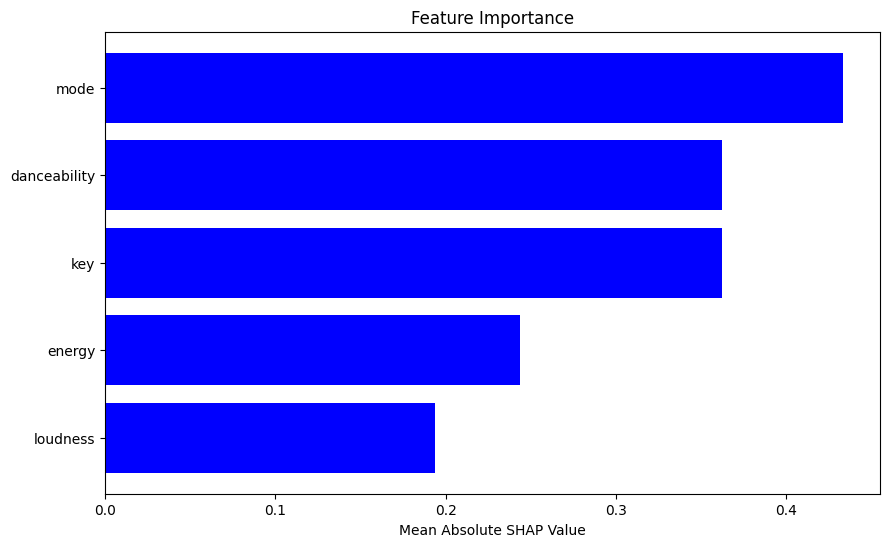

In [109]:
shap_values_abs = np.mean(np.abs(shap_values), axis=0).mean(axis=0)

feature_importance = pd.DataFrame(list(zip(X.columns, shap_values_abs)), columns=['Feature', 'SHAP Value'])
feature_importance = feature_importance.sort_values(by='SHAP Value', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature'], feature_importance['SHAP Value'], color='blue')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance')
plt.gca().invert_yaxis()
plt.show()

## GridSearchCV dla LightGBM

In [28]:
param_grid = {
    'learning_rate': [0.1, 0.01],
    'n_estimators': [50, 100, 150],
    'max_depth': [4, 6],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'subsample': [0.7, 0.8, 0.9],
    'min_child_weight': [1, 5, 10],
    'num_leaves': [31, 41, 51]
}

model_lgbm_Grid = GridSearchCV(
    estimator=LGBMClassifier(),
    param_grid=param_grid,
    cv=3,
    n_jobs=-1,
    scoring='accuracy'
)

model_lgbm_Grid.fit(X_train_scaled, y_train)

best_model_lgbm = model_lgbm_Grid.best_estimator_

y_pred_lgbm_Grid = best_model_lgbm.predict(X_test_scaled)

print("Best Model Parameters:", model_lgbm_Grid.best_params_)
print("Accuracy:", accuracy_score(y_test, y_pred_lgbm_Grid))
print("Classification Report:")
print(classification_report(y_test, y_pred_lgbm_Grid))

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

In [92]:
# Obliczanie ważności cech za pomocą feature_importances_
importances = best_model_lgbm.feature_importances_
feature_labels = X.columns

# Normalize the importance values to range [0, 1]
total_importance = sum(importances)
normalized_importances = [importance / total_importance for importance in importances]

# Create a list of tuples with indices, feature names, and their normalized importances
feature_importances = [(idx, feature, round(importance, 3)) for idx, feature, importance in zip(range(feature_labels.shape[0]), feature_labels, normalized_importances)]

# Sort features by importance in descending order
feature_importances = sorted(feature_importances, key=lambda x: x[-1], reverse=True)

# Print feature importances with decimal points
for idx, feature, importance in feature_importances:
    print(f"Variable {idx}: {feature:<20} Importance: {importance:.3f}")

Variable 1: energy               Importance: 0.120
Variable 6: acousticness         Importance: 0.120
Variable 5: speechiness          Importance: 0.108
Variable 10: tempo                Importance: 0.108
Variable 3: loudness             Importance: 0.107
Variable 0: danceability         Importance: 0.106
Variable 9: valence              Importance: 0.103
Variable 8: liveness             Importance: 0.089
Variable 7: instrumentalness     Importance: 0.083
Variable 2: key                  Importance: 0.046
Variable 4: mode                 Importance: 0.010


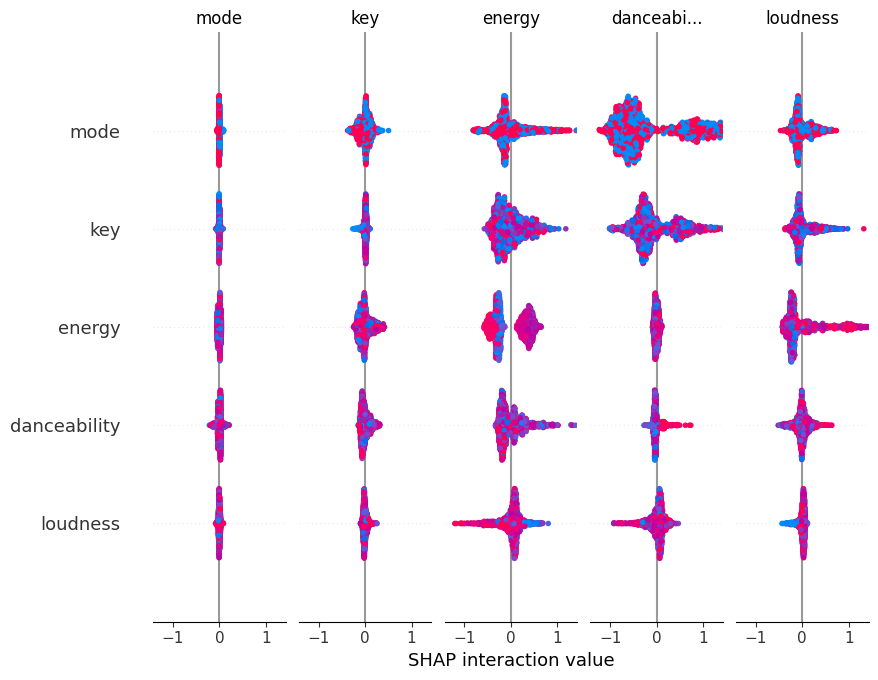

In [111]:
explainer = shap.TreeExplainer(best_model_lgbm)
shap_values = explainer.shap_values(X_train_scaled)
shap.summary_plot(shap_values, X_train_scaled, feature_names=X.columns, plot_type="bar")

In [ ]:
explainer = shap.TreeExplainer(best_model_lgbm)
shap_values = explainer.shap_values(X_train_scaled)
shap.summary_plot(shap_values, X_train_scaled, feature_names=X.columns)

## Optuna  dla LightGBM

In [32]:
def objective(trial):
    param = {
        'num_leaves': trial.suggest_int('num_leaves', 20, 300),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-8, 10.0),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-8, 10.0)
    }

    model_Optuna = LGBMClassifier(**param)
    model_Optuna.fit(X_train_scaled, y_train)
    y_pred = model_Optuna.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy
    
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)
best_params = study.best_trial.params

print('Best trial:', best_params)

model_lgbm_optuna = LGBMClassifier(**best_params)
model_lgbm_optuna.fit(X_train_scaled, y_train)
y_pred_lgbm_optuna = model_lgbm_optuna.predict(X_test_scaled)
accuracy_lgbm_optuna = accuracy_score(y_test, y_pred_lgbm_optuna)
print(f"Accuracy: {accuracy_lgbm_optuna}")
print("Classification Report:")
print(classification_report(y_test,  y_pred_lgbm_optuna))

[I 2024-06-03 15:25:59,103] A new study created in memory with name: no-name-29c79818-517c-4d46-99dd-33baa414152b


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:25:59,326] Trial 0 finished with value: 0.8380462724935732 and parameters: {'num_leaves': 264, 'max_depth': 10, 'learning_rate': 0.24132424214753168, 'n_estimators': 56, 'subsample': 0.7588592443965714, 'colsample_bytree': 0.6467917037807123, 'reg_alpha': 6.500759994021984e-06, 'reg_lambda': 0.0016693386257295207}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:00,126] Trial 1 finished with value: 0.8277634961439588 and parameters: {'num_leaves': 185, 'max_depth': 10, 'learning_rate': 0.01153650417704904, 'n_estimators': 206, 'subsample': 0.6549491815534526, 'colsample_bytree': 0.927457031986913, 'reg_alpha': 6.390436781690646e-06, 'reg_lambda': 0.00608376612790357}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:00,657] Trial 2 finished with value: 0.8354755784061697 and parameters: {'num_leaves': 197, 'max_depth': 5, 'learning_rate': 0.1061862208883363, 'n_estimators': 253, 'subsample': 0.6588298326256116, 'colsample_bytree': 0.779756746840197, 'reg_alpha': 0.12639531172206342, 'reg_lambda': 0.034421659450736955}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:00,764] Trial 3 finished with value: 0.8303341902313625 and parameters: {'num_leaves': 164, 'max_depth': 3, 'learning_rate': 0.06016408648832709, 'n_estimators': 80, 'subsample': 0.6761252160668269, 'colsample_bytree': 0.8520424424976629, 'reg_alpha': 1.0598901847037717e-06, 'reg_lambda': 1.1477029481235483}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:01,078] Trial 4 finished with value: 0.8303341902313625 and parameters: {'num_leaves': 48, 'max_depth': 9, 'learning_rate': 0.06502722642526401, 'n_estimators': 77, 'subsample': 0.7374451041105596, 'colsample_bytree': 0.8309976581863222, 'reg_alpha': 0.0013656578290351744, 'reg_lambda': 4.582288341601232e-06}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:01,241] Trial 5 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 76, 'max_depth': 4, 'learning_rate': 0.010550913917944157, 'n_estimators': 124, 'subsample': 0.9550444303501, 'colsample_bytree': 0.6070494534364521, 'reg_alpha': 4.408988084730623, 'reg_lambda': 1.0492547545848094}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:01,708] Trial 6 finished with value: 0.8251928020565553 and parameters: {'num_leaves': 120, 'max_depth': 8, 'learning_rate': 0.22873248045010153, 'n_estimators': 148, 'subsample': 0.8593714456949446, 'colsample_bytree': 0.6342787082178291, 'reg_alpha': 0.0002914824873119823, 'reg_lambda': 3.0817302462944336e-06}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:02,093] Trial 7 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 247, 'max_depth': 8, 'learning_rate': 0.08808989142829442, 'n_estimators': 103, 'subsample': 0.7902558880966429, 'colsample_bytree': 0.9641100492780678, 'reg_alpha': 0.5416141747294992, 'reg_lambda': 0.0005368644036486236}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:02,633] Trial 8 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 180, 'max_depth': 10, 'learning_rate': 0.16120293704982247, 'n_estimators': 126, 'subsample': 0.7724770471797361, 'colsample_bytree': 0.912273940442197, 'reg_alpha': 2.5029762235726818e-05, 'reg_lambda': 0.00013620815432347343}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:03,390] Trial 9 finished with value: 0.8303341902313625 and parameters: {'num_leaves': 281, 'max_depth': 9, 'learning_rate': 0.012021374371164446, 'n_estimators': 256, 'subsample': 0.9919154333458399, 'colsample_bytree': 0.8662824529187798, 'reg_alpha': 2.8788348732836475, 'reg_lambda': 1.4417264771341263e-06}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:03,974] Trial 10 finished with value: 0.8303341902313625 and parameters: {'num_leaves': 292, 'max_depth': 6, 'learning_rate': 0.028743144195615817, 'n_estimators': 189, 'subsample': 0.8711428961842075, 'colsample_bytree': 0.7256201115743389, 'reg_alpha': 1.547790849673443e-08, 'reg_lambda': 2.9948080355355604e-08}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:04,565] Trial 11 finished with value: 0.8354755784061697 and parameters: {'num_leaves': 232, 'max_depth': 5, 'learning_rate': 0.142746357926499, 'n_estimators': 289, 'subsample': 0.6096369137150355, 'colsample_bytree': 0.7329349055095105, 'reg_alpha': 0.023549498105171533, 'reg_lambda': 0.05371045956729809}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:04,941] Trial 12 finished with value: 0.8354755784061697 and parameters: {'num_leaves': 222, 'max_depth': 6, 'learning_rate': 0.28598493006803194, 'n_estimators': 225, 'subsample': 0.7095984518232159, 'colsample_bytree': 0.7350674627512123, 'reg_alpha': 0.05055085514719112, 'reg_lambda': 0.0233113312651152}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:06,020] Trial 13 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 208, 'max_depth': 7, 'learning_rate': 0.11964448094962028, 'n_estimators': 293, 'subsample': 0.6063818133700213, 'colsample_bytree': 0.656275206138225, 'reg_alpha': 8.529555977830819e-08, 'reg_lambda': 0.0012088406774225613}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:06,527] Trial 14 finished with value: 0.8354755784061697 and parameters: {'num_leaves': 137, 'max_depth': 5, 'learning_rate': 0.03786616706487715, 'n_estimators': 243, 'subsample': 0.8462219941618014, 'colsample_bytree': 0.769378438258283, 'reg_alpha': 0.0005116052852639163, 'reg_lambda': 9.595279270795341}. Best is trial 0 with value: 0.8380462724935732.
[I 2024-06-03 15:26:06,628] Trial 15 finished with value: 0.8277634961439588 and parameters: {'num_leaves': 261, 'max_depth': 3, 'learning_rate': 0.19960390742736064, 'n_estimators': 53, 'subsample': 0.7300582792245204, 'colsample_bytree': 0.6745835883518861, 'reg_alpha': 0.012436191472106487, 'reg_lambda': 5.726769276497676e-05}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:06,944] Trial 16 finished with value: 0.8277634961439588 and parameters: {'num_leaves': 108, 'max_depth': 5, 'learning_rate': 0.09492237407290025, 'n_estimators': 168, 'subsample': 0.6661491159275253, 'colsample_bytree': 0.6987429252353781, 'reg_alpha': 3.2223395775372774e-05, 'reg_lambda': 0.10394616163066506}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:07,741] Trial 17 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 206, 'max_depth': 7, 'learning_rate': 0.03641623432451042, 'n_estimators': 264, 'subsample': 0.8257046986335084, 'colsample_bytree': 0.7835864571099888, 'reg_alpha': 3.0476112876279044e-07, 'reg_lambda': 0.0012533495699074706}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:08,049] Trial 18 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 267, 'max_depth': 4, 'learning_rate': 0.2655370313452316, 'n_estimators': 211, 'subsample': 0.9138825218327975, 'colsample_bytree': 0.608005992498909, 'reg_alpha': 0.2004602147885449, 'reg_lambda': 4.320237844730235e-05}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:08,680] Trial 19 finished with value: 0.8354755784061697 and parameters: {'num_leaves': 300, 'max_depth': 8, 'learning_rate': 0.10684832651757377, 'n_estimators': 165, 'subsample': 0.7582837735327292, 'colsample_bytree': 0.8133412942253538, 'reg_alpha': 0.002921767665566867, 'reg_lambda': 0.008564202880268188}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:08,822] Trial 20 finished with value: 0.8380462724935732 and parameters: {'num_leaves': 243, 'max_depth': 4, 'learning_rate': 0.18788260915852092, 'n_estimators': 52, 'subsample': 0.6938857294467247, 'colsample_bytree': 0.8899462317369032, 'reg_alpha': 6.406639743157142e-05, 'reg_lambda': 0.9049642481504234}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:08,994] Trial 21 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 234, 'max_depth': 4, 'learning_rate': 0.17780419534496253, 'n_estimators': 59, 'subsample': 0.694330989145938, 'colsample_bytree': 0.8895997885128627, 'reg_alpha': 8.788697173902818e-05, 'reg_lambda': 0.42225358909795685}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:09,276] Trial 22 finished with value: 0.8354755784061697 and parameters: {'num_leaves': 195, 'max_depth': 5, 'learning_rate': 0.14381160785914954, 'n_estimators': 94, 'subsample': 0.6474705449255227, 'colsample_bytree': 0.9793931541103236, 'reg_alpha': 4.0826326342279434e-06, 'reg_lambda': 9.907029041738578}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:09,652] Trial 23 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 258, 'max_depth': 6, 'learning_rate': 0.07949442721009538, 'n_estimators': 116, 'subsample': 0.7080591827630636, 'colsample_bytree': 0.9378545676055772, 'reg_alpha': 5.5120161566861954e-06, 'reg_lambda': 0.22268004046857737}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:09,803] Trial 24 finished with value: 0.8174807197943444 and parameters: {'num_leaves': 143, 'max_depth': 4, 'learning_rate': 0.29769419619823456, 'n_estimators': 67, 'subsample': 0.6337582716280592, 'colsample_bytree': 0.8739095460793871, 'reg_alpha': 0.00012933626041959588, 'reg_lambda': 0.005193531340005634}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:10,026] Trial 25 finished with value: 0.8354755784061697 and parameters: {'num_leaves': 241, 'max_depth': 3, 'learning_rate': 0.21310150427719296, 'n_estimators': 144, 'subsample': 0.8121123614700281, 'colsample_bytree': 0.8164638911944498, 'reg_alpha': 0.003207692903608696, 'reg_lambda': 2.0507000394182184}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:10,311] Trial 26 finished with value: 0.8354755784061697 and parameters: {'num_leaves': 274, 'max_depth': 7, 'learning_rate': 0.12928715134539753, 'n_estimators': 89, 'subsample': 0.7514253089571817, 'colsample_bytree': 0.7690132092184024, 'reg_alpha': 1.30832282283328e-06, 'reg_lambda': 0.04058609331992793}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:10,494] Trial 27 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 214, 'max_depth': 5, 'learning_rate': 0.1760583894552273, 'n_estimators': 51, 'subsample': 0.6904596754370389, 'colsample_bytree': 0.9957272927290572, 'reg_alpha': 2.0833727903149406e-05, 'reg_lambda': 0.01357271474104344}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

[I 2024-06-03 15:26:10,852] Trial 28 finished with value: 0.8354755784061697 and parameters: {'num_leaves': 172, 'max_depth': 4, 'learning_rate': 0.07405490942991802, 'n_estimators': 188, 'subsample': 0.7857950371424687, 'colsample_bytree': 0.840511395377807, 'reg_alpha': 0.3592090979063768, 'reg_lambda': 0.0025511268052658223}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:11,592] Trial 29 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 21, 'max_depth': 9, 'learning_rate': 0.015397402671670102, 'n_estimators': 233, 'subsample': 0.6396040629285763, 'colsample_bytree': 0.9118165895074046, 'reg_alpha': 0.0006909626850435873, 'reg_lambda': 0.2501398497410454}. Best is trial 0 with value: 0.8380462724935732.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:12,236] Trial 30 finished with value: 0.8406169665809768 and parameters: {'num_leaves': 187, 'max_depth': 6, 'learning_rate': 0.04705917514262658, 'n_estimators': 277, 'subsample': 0.7248042248143027, 'colsample_bytree': 0.703863997668182, 'reg_alpha': 2.1330383182972387e-07, 'reg_lambda': 0.000229471388787937}. Best is trial 30 with value: 0.8406169665809768.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:12,861] Trial 31 finished with value: 0.8431876606683805 and parameters: {'num_leaves': 190, 'max_depth': 6, 'learning_rate': 0.04622421833513035, 'n_estimators': 273, 'subsample': 0.7247115984813943, 'colsample_bytree': 0.6940362554443861, 'reg_alpha': 1.0032710501204057e-07, 'reg_lambda': 0.00025522710582659316}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:13,924] Trial 32 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 188, 'max_depth': 10, 'learning_rate': 0.04155705884538528, 'n_estimators': 279, 'subsample': 0.7151487028971715, 'colsample_bytree': 0.6856769560911451, 'reg_alpha': 4.2757967848069184e-08, 'reg_lambda': 1.575269281669413e-05}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:14,690] Trial 33 finished with value: 0.8226221079691517 and parameters: {'num_leaves': 152, 'max_depth': 6, 'learning_rate': 0.024111825185038, 'n_estimators': 269, 'subsample': 0.7373695129218345, 'colsample_bytree': 0.6420200282752929, 'reg_alpha': 3.2784315154609564e-07, 'reg_lambda': 0.0002490947769289389}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:14,958] Trial 34 finished with value: 0.8303341902313625 and parameters: {'num_leaves': 162, 'max_depth': 7, 'learning_rate': 0.05112759265531433, 'n_estimators': 72, 'subsample': 0.6823194795969802, 'colsample_bytree': 0.7164232108216664, 'reg_alpha': 1.3091108306501753e-06, 'reg_lambda': 6.752452724470178e-07}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:15,707] Trial 35 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 221, 'max_depth': 6, 'learning_rate': 0.056510900114404135, 'n_estimators': 298, 'subsample': 0.758143710326757, 'colsample_bytree': 0.658673981601398, 'reg_alpha': 2.0541463146414655e-07, 'reg_lambda': 1.6467191469232904e-05}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:16,675] Trial 36 finished with value: 0.8354755784061697 and parameters: {'num_leaves': 250, 'max_depth': 8, 'learning_rate': 0.04700404390340837, 'n_estimators': 217, 'subsample': 0.7183457442821624, 'colsample_bytree': 0.7518444719875244, 'reg_alpha': 1.821633257659105e-08, 'reg_lambda': 0.000711893630464975}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:17,332] Trial 37 finished with value: 0.8303341902313625 and parameters: {'num_leaves': 118, 'max_depth': 7, 'learning_rate': 0.029709236258520053, 'n_estimators': 197, 'subsample': 0.6666379354380898, 'colsample_bytree': 0.7002953288692576, 'reg_alpha': 2.9125157506662594e-06, 'reg_lambda': 3.9926046912256344e-07}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:17,643] Trial 38 finished with value: 0.8277634961439588 and parameters: {'num_leaves': 186, 'max_depth': 3, 'learning_rate': 0.02663784592949226, 'n_estimators': 242, 'subsample': 0.7836153112999106, 'colsample_bytree': 0.6291635862963345, 'reg_alpha': 1.2708880594851047e-05, 'reg_lambda': 0.0001110215491123547}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:18,133] Trial 39 finished with value: 0.8431876606683805 and parameters: {'num_leaves': 91, 'max_depth': 10, 'learning_rate': 0.07375546316035463, 'n_estimators': 105, 'subsample': 0.8028019850799377, 'colsample_bytree': 0.6013532717523318, 'reg_alpha': 9.005162180080981e-08, 'reg_lambda': 9.256334166664301e-06}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:18,640] Trial 40 finished with value: 0.8303341902313625 and parameters: {'num_leaves': 99, 'max_depth': 10, 'learning_rate': 0.017918828465044882, 'n_estimators': 107, 'subsample': 0.8118567727019069, 'colsample_bytree': 0.6187532427815167, 'reg_alpha': 1.0521410276221397e-07, 'reg_lambda': 1.3564801348479269e-05}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:19,118] Trial 41 finished with value: 0.8303341902313625 and parameters: {'num_leaves': 61, 'max_depth': 9, 'learning_rate': 0.06811400664461795, 'n_estimators': 81, 'subsample': 0.7490091937420321, 'colsample_bytree': 0.6585736776765494, 'reg_alpha': 6.255569583168798e-07, 'reg_lambda': 8.367178906461086e-08}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:19,530] Trial 42 finished with value: 0.8380462724935732 and parameters: {'num_leaves': 88, 'max_depth': 10, 'learning_rate': 0.05974350529098336, 'n_estimators': 64, 'subsample': 0.7675095068822617, 'colsample_bytree': 0.600939491779758, 'reg_alpha': 4.8122239504702695e-08, 'reg_lambda': 0.00028942268536661633}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:20,415] Trial 43 finished with value: 0.8329048843187661 and parameters: {'num_leaves': 282, 'max_depth': 9, 'learning_rate': 0.048001315082958004, 'n_estimators': 150, 'subsample': 0.729366357351812, 'colsample_bytree': 0.6414619027026994, 'reg_alpha': 1.296351001466262e-08, 'reg_lambda': 4.630633999958356e-06}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:21,068] Trial 44 finished with value: 0.8251928020565553 and parameters: {'num_leaves': 173, 'max_depth': 8, 'learning_rate': 0.2473723229528052, 'n_estimators': 132, 'subsample': 0.8340855251502036, 'colsample_bytree': 0.6881290527249058, 'reg_alpha': 7.279079502856127e-05, 'reg_lambda': 4.4699477243662815e-05}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:21,599] Trial 45 finished with value: 0.8251928020565553 and parameters: {'num_leaves': 136, 'max_depth': 10, 'learning_rate': 0.034813503666837976, 'n_estimators': 84, 'subsample': 0.7999478131723777, 'colsample_bytree': 0.6750890315012078, 'reg_alpha': 6.899637709075651e-07, 'reg_lambda': 6.796116091522648e-06}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:21,986] Trial 46 finished with value: 0.8277634961439588 and parameters: {'num_leaves': 203, 'max_depth': 6, 'learning_rate': 0.021311254273586166, 'n_estimators': 97, 'subsample': 0.9074334640273931, 'colsample_bytree': 0.6213576633402567, 'reg_alpha': 1.7751164694732857e-06, 'reg_lambda': 0.003261491221901096}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:22,439] Trial 47 finished with value: 0.8277634961439588 and parameters: {'num_leaves': 28, 'max_depth': 9, 'learning_rate': 0.08967541417433376, 'n_estimators': 111, 'subsample': 0.875680027583963, 'colsample_bytree': 0.7135377969791268, 'reg_alpha': 1.0534829458631339e-07, 'reg_lambda': 0.0001720399207576129}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-03 15:26:23,375] Trial 48 finished with value: 0.8277634961439588 and parameters: {'num_leaves': 49, 'max_depth': 8, 'learning_rate': 0.04213632322856968, 'n_estimators': 282, 'subsample': 0.6982645862034043, 'colsample_bytree': 0.6492326017129224, 'reg_alpha': 1.0730935052898127e-05, 'reg_lambda': 1.7103226552837392e-06}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-06-03 15:26:24,080] Trial 49 finished with value: 0.8303341902313625 and parameters: {'num_leaves': 246, 'max_depth': 5, 'learning_rate': 0.20457064333295827, 'n_estimators': 255, 'subsample': 0.7789777147216463, 'colsample_bytree': 0.668295346262759, 'reg_alpha': 5.1619050949811895e-08, 'reg_lambda': 0.0008368912813726957}. Best is trial 31 with value: 0.8431876606683805.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [95]:
importances = model_lgbm_optuna.feature_importances_
feature_labels = X.columns
total_importance = sum(importances)
normalized_importances = [importance / total_importance for importance in importances]
feature_importances = [(idx, feature, round(importance, 3)) for idx, feature, importance in zip(range(feature_labels.shape[0]), feature_labels, normalized_importances)]

feature_importances = sorted(feature_importances, key=lambda x: x[-1], reverse=True)
for idx, feature, importance in feature_importances:
    print(f"Variable {idx}: {feature:<20} Importance: {importance:.3f}")

Variable 5: speechiness          Importance: 0.118
Variable 3: loudness             Importance: 0.116
Variable 0: danceability         Importance: 0.113
Variable 1: energy               Importance: 0.112
Variable 10: tempo                Importance: 0.109
Variable 8: liveness             Importance: 0.105
Variable 9: valence              Importance: 0.105
Variable 6: acousticness         Importance: 0.104
Variable 7: instrumentalness     Importance: 0.062
Variable 2: key                  Importance: 0.048
Variable 4: mode                 Importance: 0.009


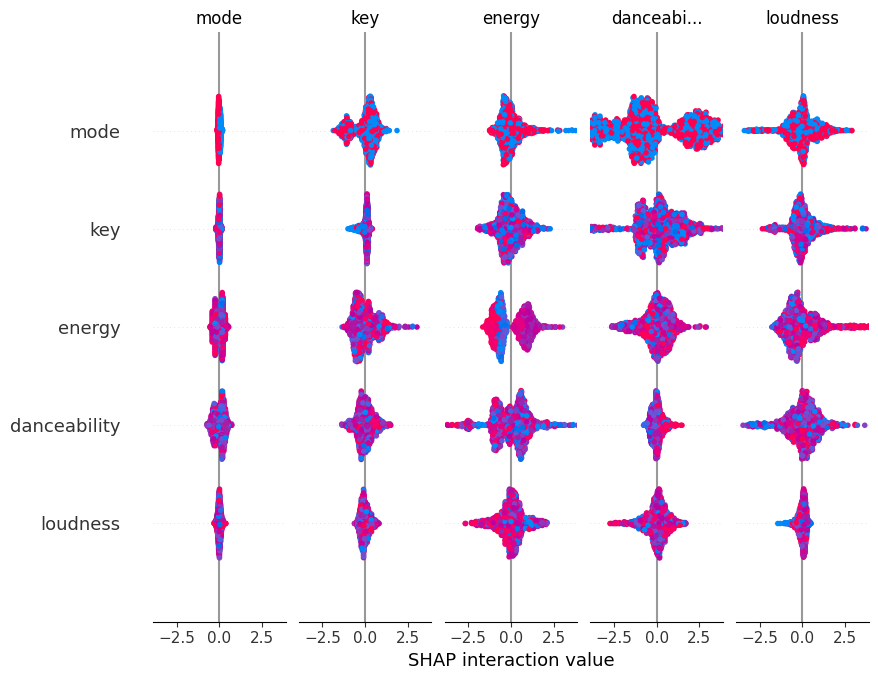

In [113]:
explainer = shap.TreeExplainer(model_lgbm_optuna)
shap_values = explainer.shap_values(X_train_scaled)
shap.summary_plot(shap_values, X_train_scaled, feature_names=X.columns, plot_type="bar")

In [ ]:
explainer = shap.TreeExplainer(model_lgbm_optuna)
shap_values = explainer.shap_values(X_train_scaled)
shap.summary_plot(shap_values, X_train_scaled, feature_names=X.columns)

## Hyperopt dla LightGBM

In [50]:
import logging
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials, space_eval
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score

logging.basicConfig(level=logging.INFO)

# Simplified hyperparameter space
space = {
    'num_leaves': hp.choice('num_leaves', range(20, 101, 10)),
    'max_depth': hp.choice('max_depth', range(3, 7)),
    'learning_rate': hp.loguniform('learning_rate', -3, -1),
    'n_estimators': hp.choice('n_estimators', range(50, 151, 50)),
    'subsample': hp.uniform('subsample', 0.7, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.7, 1.0),
    'reg_alpha': hp.loguniform('reg_alpha', np.log(1e-6), np.log(1)),
    'reg_lambda': hp.loguniform('reg_lambda', np.log(1e-6), np.log(1))
}

def objective(params):
    try:
        model = LGBMClassifier(**params)
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_test_scaled)
        accuracy = accuracy_score(y_test, y_pred)
        logging.info(f"Evaluating with params: {params} | Accuracy: {accuracy}")
        return {'loss': -accuracy, 'status': STATUS_OK}
    except Exception as e:
        logging.error(f"Error during training with params: {params}", exc_info=True)
        return {'loss': 0, 'status': STATUS_FAIL}

trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=20, trials=trials)
best_params = space_eval(space, best)

print('Best parameters:', best_params)

model_lgbm_hyperopt = LGBMClassifier(**best_params)
model_lgbm_hyperopt.fit(X_train_scaled, y_train)
y_pred_lgbm_hyperopt = model_lgbm_hyperopt.predict(X_test_scaled)
accuracy_lgbm_hyperopt = accuracy_score(y_test, y_pred_lgbm_hyperopt)
print(f"Accuracy: {accuracy_lgbm_hyperopt}")
print("Classification Report:")
print(classification_report(y_test, y_pred_lgbm_hyperopt))

  0%|          | 0/20 [00:00<?, ?trial/s, best loss=?]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.010005 seconds
INFO:hyperopt.tpe:TPE using 0 trials


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                     
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952 
[LightGBM] [Info] Start training from score -5.267858 
[LightGBM] [Info] Start training from score -2.576615 
[LightGBM] [Info] Start training from score -0.210021 
[LightGBM] [Info] Start training from score -2.940580 
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

INFO:root:Evaluating with params: {'colsample_bytree': 0.7993656673237086, 'learning_rate': 0.18942330705758564, 'max_depth': 3, 'n_estimators': 50, 'num_leaves': 100, 'reg_alpha': 5.178070903043812e-05, 'reg_lambda': 0.00020895008041700992, 'subsample': 0.9740814602652181} | Accuracy: 0.8329048843187661


  5%|▌         | 1/20 [00:00<00:13,  1.37trial/s, best loss: -0.8329048843187661]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.007136 seconds
INFO:hyperopt.tpe:TPE using 1/1 trials with best loss -0.832905


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                            
[LightGBM] [Info] Start training from score -5.267858                            
[LightGBM] [Info] Start training from score -2.576615                            
[LightGBM] [Info] Start training from score -0.210021                            
[LightGBM] [Info] Start training from score -2.940580                            
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGB

INFO:root:Evaluating with params: {'colsample_bytree': 0.9999988961019513, 'learning_rate': 0.11416323982776516, 'max_depth': 6, 'n_estimators': 100, 'num_leaves': 20, 'reg_alpha': 0.019857455094832183, 'reg_lambda': 0.052972826283852734, 'subsample': 0.8989977517937265} | Accuracy: 0.8303341902313625


 10%|█         | 2/20 [00:02<00:21,  1.19s/trial, best loss: -0.8329048843187661]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.000000 seconds
INFO:hyperopt.tpe:TPE using 2/2 trials with best loss -0.832905


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                            
[LightGBM] [Info] Start training from score -5.267858                            
[LightGBM] [Info] Start training from score -2.576615                            
[LightGBM] [Info] Start training from score -0.210021                            
[LightGBM] [Info] Start training from score -2.940580                            
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGB

INFO:root:Evaluating with params: {'colsample_bytree': 0.7468221827309157, 'learning_rate': 0.19088444187360218, 'max_depth': 6, 'n_estimators': 150, 'num_leaves': 50, 'reg_alpha': 0.7382146423064593, 'reg_lambda': 0.05686859101707263, 'subsample': 0.8252463201237462} | Accuracy: 0.8277634961439588


 15%|█▌        | 3/20 [00:05<00:33,  1.99s/trial, best loss: -0.8329048843187661]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.000000 seconds
INFO:hyperopt.tpe:TPE using 3/3 trials with best loss -0.832905


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                            
[LightGBM] [Info] Start training from score -5.267858                            
[LightGBM] [Info] Start training from score -2.576615                            
[LightGBM] [Info] Start training from score -0.210021                            
[LightGBM] [Info] Start training from score -2.940580                            
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGB

INFO:root:Evaluating with params: {'colsample_bytree': 0.7492099691169594, 'learning_rate': 0.23230492925940494, 'max_depth': 3, 'n_estimators': 100, 'num_leaves': 60, 'reg_alpha': 0.0018577235661790643, 'reg_lambda': 0.05311095973791891, 'subsample': 0.8996046433742865} | Accuracy: 0.8354755784061697


 20%|██        | 4/20 [00:06<00:27,  1.72s/trial, best loss: -0.8354755784061697]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.000000 seconds
INFO:hyperopt.tpe:TPE using 4/4 trials with best loss -0.835476


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                            
[LightGBM] [Info] Start training from score -5.267858                            
[LightGBM] [Info] Start training from score -2.576615                            
[LightGBM] [Info] Start training from score -0.210021                            
[LightGBM] [Info] Start training from score -2.940580                            
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGB

INFO:root:Evaluating with params: {'colsample_bytree': 0.7387817686872092, 'learning_rate': 0.0671991667633725, 'max_depth': 4, 'n_estimators': 150, 'num_leaves': 20, 'reg_alpha': 0.03377846447585138, 'reg_lambda': 2.35592351318447e-05, 'subsample': 0.7800815443690816} | Accuracy: 0.8380462724935732


 25%|██▌       | 5/20 [00:08<00:29,  1.98s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.003238 seconds
INFO:hyperopt.tpe:TPE using 5/5 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                            
[LightGBM] [Info] Start training from score -5.267858                            
[LightGBM] [Info] Start training from score -2.576615                            
[LightGBM] [Info] Start training from score -0.210021                            
[LightGBM] [Info] Start training from score -2.940580                            
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGB

INFO:root:Evaluating with params: {'colsample_bytree': 0.8975668429035514, 'learning_rate': 0.10867184274099283, 'max_depth': 6, 'n_estimators': 100, 'num_leaves': 80, 'reg_alpha': 0.30067093934153905, 'reg_lambda': 7.320303997631123e-05, 'subsample': 0.7744931461225025} | Accuracy: 0.8277634961439588


 30%|███       | 6/20 [00:10<00:27,  1.99s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.012121 seconds
INFO:hyperopt.tpe:TPE using 6/6 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                            
[LightGBM] [Info] Start training from score -5.267858                            
[LightGBM] [Info] Start training from score -2.576615                            
[LightGBM] [Info] Start training from score -0.210021                            
[LightGBM] [Info] Start training from score -2.940580                            
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGB

INFO:root:Evaluating with params: {'colsample_bytree': 0.8356400542523861, 'learning_rate': 0.10146417065724081, 'max_depth': 3, 'n_estimators': 50, 'num_leaves': 80, 'reg_alpha': 0.2845513626252148, 'reg_lambda': 0.0021948686284768313, 'subsample': 0.8914693478530306} | Accuracy: 0.8380462724935732


 35%|███▌      | 7/20 [00:11<00:20,  1.60s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.004392 seconds
INFO:hyperopt.tpe:TPE using 7/7 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                            
[LightGBM] [Info] Start training from score -5.267858                            
[LightGBM] [Info] Start training from score -2.576615                            
[LightGBM] [Info] Start training from score -0.210021                            
[LightGBM] [Info] Start training from score -2.940580                            
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGB

INFO:root:Evaluating with params: {'colsample_bytree': 0.805535530880003, 'learning_rate': 0.06570891638886486, 'max_depth': 5, 'n_estimators': 100, 'num_leaves': 60, 'reg_alpha': 5.527911569575567e-06, 'reg_lambda': 0.41232528578496774, 'subsample': 0.8206130794765897} | Accuracy: 0.8303341902313625


 40%|████      | 8/20 [00:14<00:22,  1.85s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.000000 seconds
INFO:hyperopt.tpe:TPE using 8/8 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                            
[LightGBM] [Info] Start training from score -5.267858                            
[LightGBM] [Info] Start training from score -2.576615                            
[LightGBM] [Info] Start training from score -0.210021                            
[LightGBM] [Info] Start training from score -2.940580                            
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGB

INFO:root:Evaluating with params: {'colsample_bytree': 0.737418135169315, 'learning_rate': 0.24594070518738967, 'max_depth': 6, 'n_estimators': 50, 'num_leaves': 50, 'reg_alpha': 0.9803507964035882, 'reg_lambda': 0.0634086216496208, 'subsample': 0.7691842834395204} | Accuracy: 0.8226221079691517


 45%|████▌     | 9/20 [00:15<00:17,  1.59s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.005382 seconds
INFO:hyperopt.tpe:TPE using 9/9 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                            
[LightGBM] [Info] Start training from score -5.267858                            
[LightGBM] [Info] Start training from score -2.576615                            
[LightGBM] [Info] Start training from score -0.210021                            
[LightGBM] [Info] Start training from score -2.940580                            
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf       
[LightGB

INFO:root:Evaluating with params: {'colsample_bytree': 0.8576589023041086, 'learning_rate': 0.14479671098825173, 'max_depth': 6, 'n_estimators': 100, 'num_leaves': 50, 'reg_alpha': 0.00025836756346808265, 'reg_lambda': 1.2885950021679452e-06, 'subsample': 0.9122730316073832} | Accuracy: 0.8380462724935732


 50%|█████     | 10/20 [00:20<00:26,  2.68s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.010015 seconds
INFO:hyperopt.tpe:TPE using 10/10 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                 
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                             
[LightGBM] [Info] Start training from score -5.267858                             
[LightGBM] [Info] Start training from score -2.576615                             
[LightGBM] [Info] Start training from score -0.210021                             
[LightGBM] [Info] Start training from score -2.940580                             
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        

INFO:root:Evaluating with params: {'colsample_bytree': 0.8952899764070884, 'learning_rate': 0.3385142024603848, 'max_depth': 5, 'n_estimators': 100, 'num_leaves': 30, 'reg_alpha': 0.05707562060653929, 'reg_lambda': 0.0008487621336336099, 'subsample': 0.7147337504471435} | Accuracy: 0.8226221079691517


 55%|█████▌    | 11/20 [00:22<00:21,  2.41s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.000000 seconds
INFO:hyperopt.tpe:TPE using 11/11 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                 
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                             
[LightGBM] [Info] Start training from score -5.267858                             
[LightGBM] [Info] Start training from score -2.576615                             
[LightGBM] [Info] Start training from score -0.210021                             
[LightGBM] [Info] Start training from score -2.940580                             
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        

INFO:root:Evaluating with params: {'colsample_bytree': 0.7792005736690936, 'learning_rate': 0.1525506043355977, 'max_depth': 4, 'n_estimators': 150, 'num_leaves': 50, 'reg_alpha': 0.0002335184810253586, 'reg_lambda': 0.0008510437458073143, 'subsample': 0.7510212998221075} | Accuracy: 0.8303341902313625


 60%|██████    | 12/20 [00:24<00:19,  2.42s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.010811 seconds
INFO:hyperopt.tpe:TPE using 12/12 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                 
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                             
[LightGBM] [Info] Start training from score -5.267858                             
[LightGBM] [Info] Start training from score -2.576615                             
[LightGBM] [Info] Start training from score -0.210021                             
[LightGBM] [Info] Start training from score -2.940580                             
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        

INFO:root:Evaluating with params: {'colsample_bytree': 0.9662964475679637, 'learning_rate': 0.1219648196667242, 'max_depth': 3, 'n_estimators': 100, 'num_leaves': 40, 'reg_alpha': 1.4897900821216544e-06, 'reg_lambda': 0.022623402960078483, 'subsample': 0.7728873480094001} | Accuracy: 0.8303341902313625


 65%|██████▌   | 13/20 [00:26<00:15,  2.23s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.006608 seconds
INFO:hyperopt.tpe:TPE using 13/13 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                 
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                             
[LightGBM] [Info] Start training from score -5.267858                             
[LightGBM] [Info] Start training from score -2.576615                             
[LightGBM] [Info] Start training from score -0.210021                             
[LightGBM] [Info] Start training from score -2.940580                             
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        

INFO:root:Evaluating with params: {'colsample_bytree': 0.7719454589264205, 'learning_rate': 0.2375235009095333, 'max_depth': 6, 'n_estimators': 150, 'num_leaves': 70, 'reg_alpha': 0.05413526561902342, 'reg_lambda': 2.2954211069729898e-05, 'subsample': 0.9673048650653093} | Accuracy: 0.8277634961439588


 70%|███████   | 14/20 [00:30<00:16,  2.71s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.000000 seconds
INFO:hyperopt.tpe:TPE using 14/14 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                 
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                             
[LightGBM] [Info] Start training from score -5.267858                             
[LightGBM] [Info] Start training from score -2.576615                             
[LightGBM] [Info] Start training from score -0.210021                             
[LightGBM] [Info] Start training from score -2.940580                             
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        

INFO:root:Evaluating with params: {'colsample_bytree': 0.829485655376905, 'learning_rate': 0.21447256554370075, 'max_depth': 5, 'n_estimators': 100, 'num_leaves': 60, 'reg_alpha': 0.011404227942087447, 'reg_lambda': 0.030431981286904237, 'subsample': 0.8669593646054499} | Accuracy: 0.8226221079691517


 75%|███████▌  | 15/20 [00:32<00:13,  2.61s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.006793 seconds
INFO:hyperopt.tpe:TPE using 15/15 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                 
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                             
[LightGBM] [Info] Start training from score -5.267858                             
[LightGBM] [Info] Start training from score -2.576615                             
[LightGBM] [Info] Start training from score -0.210021                             
[LightGBM] [Info] Start training from score -2.940580                             
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        

INFO:root:Evaluating with params: {'colsample_bytree': 0.7687388800095832, 'learning_rate': 0.13044459862802862, 'max_depth': 5, 'n_estimators': 50, 'num_leaves': 80, 'reg_alpha': 1.6416208765555172e-06, 'reg_lambda': 0.00021438855175968382, 'subsample': 0.726493673586573} | Accuracy: 0.8329048843187661


 80%|████████  | 16/20 [00:33<00:08,  2.16s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.011875 seconds
INFO:hyperopt.tpe:TPE using 16/16 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                 
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                             
[LightGBM] [Info] Start training from score -5.267858                             
[LightGBM] [Info] Start training from score -2.576615                             
[LightGBM] [Info] Start training from score -0.210021                             
[LightGBM] [Info] Start training from score -2.940580                             
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        

INFO:root:Evaluating with params: {'colsample_bytree': 0.729419580065562, 'learning_rate': 0.28450065717283257, 'max_depth': 4, 'n_estimators': 150, 'num_leaves': 80, 'reg_alpha': 0.00045708389295279, 'reg_lambda': 0.1456825382455159, 'subsample': 0.8808047885043482} | Accuracy: 0.8329048843187661


 85%|████████▌ | 17/20 [00:37<00:07,  2.55s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.004790 seconds
INFO:hyperopt.tpe:TPE using 17/17 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                 
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                             
[LightGBM] [Info] Start training from score -5.267858                             
[LightGBM] [Info] Start training from score -2.576615                             
[LightGBM] [Info] Start training from score -0.210021                             
[LightGBM] [Info] Start training from score -2.940580                             
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        

INFO:root:Evaluating with params: {'colsample_bytree': 0.8999710066032744, 'learning_rate': 0.2520576466633789, 'max_depth': 4, 'n_estimators': 50, 'num_leaves': 60, 'reg_alpha': 0.2852238702437223, 'reg_lambda': 0.17638921460584744, 'subsample': 0.9164093289590987} | Accuracy: 0.8354755784061697


 90%|█████████ | 18/20 [00:38<00:04,  2.14s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.006373 seconds
INFO:hyperopt.tpe:TPE using 18/18 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                 
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                             
[LightGBM] [Info] Start training from score -5.267858                             
[LightGBM] [Info] Start training from score -2.576615                             
[LightGBM] [Info] Start training from score -0.210021                             
[LightGBM] [Info] Start training from score -2.940580                             
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        

INFO:root:Evaluating with params: {'colsample_bytree': 0.7943244705551253, 'learning_rate': 0.22154846002256828, 'max_depth': 4, 'n_estimators': 100, 'num_leaves': 80, 'reg_alpha': 0.14308547780986688, 'reg_lambda': 1.2883087774313598e-06, 'subsample': 0.8945033239523992} | Accuracy: 0.8329048843187661


 95%|█████████▌| 19/20 [00:40<00:02,  2.21s/trial, best loss: -0.8380462724935732]

INFO:hyperopt.tpe:build_posterior_wrapper took 0.007042 seconds
INFO:hyperopt.tpe:TPE using 19/19 trials with best loss -0.838046


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310                                                 
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952                             
[LightGBM] [Info] Start training from score -5.267858                             
[LightGBM] [Info] Start training from score -2.576615                             
[LightGBM] [Info] Start training from score -0.210021                             
[LightGBM] [Info] Start training from score -2.940580                             
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf        

INFO:root:Evaluating with params: {'colsample_bytree': 0.8711413142151051, 'learning_rate': 0.22279152753600823, 'max_depth': 3, 'n_estimators': 150, 'num_leaves': 70, 'reg_alpha': 0.0006234055368766818, 'reg_lambda': 0.00021507063340653047, 'subsample': 0.9446387097447593} | Accuracy: 0.8226221079691517


100%|██████████| 20/20 [00:43<00:00,  2.17s/trial, best loss: -0.8380462724935732]
Best parameters: {'colsample_bytree': 0.7387817686872092, 'learning_rate': 0.0671991667633725, 'max_depth': 4, 'n_estimators': 150, 'num_leaves': 20, 'reg_alpha': 0.03377846447585138, 'reg_lambda': 2.35592351318447e-05, 'subsample': 0.7800815443690816}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2310
[LightGBM] [Info] Number of data points in the train set: 1552, number of used features: 11
[LightGBM] [Info] Start training from score -2.892952
[LightGBM] [Info] Start training from score -5.267858
[LightGBM] [Info] Start training from score -2.576615
[LightGBM] [Info] Start training from score -0.210021
[LightGBM] [Info] Start training from score -2.940580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

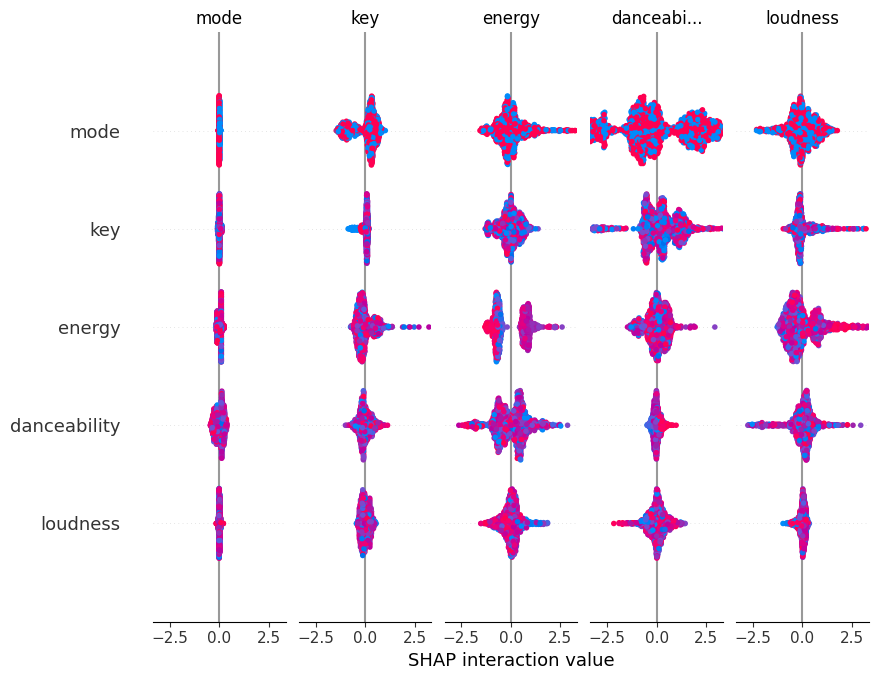

In [114]:
explainer = shap.TreeExplainer(model_lgbm_hyperopt)
shap_values = explainer.shap_values(X_train_scaled)
shap.summary_plot(shap_values, X_train_scaled, feature_names=X.columns, plot_type="bar")

In [ ]:
explainer = shap.TreeExplainer(model_lgbm_hyperopt)
shap_values = explainer.shap_values(X_train_scaled)
shap.summary_plot(shap_values, X_train_scaled, feature_names=X.columns)

# Zestawienie

In [52]:
from sklearn.metrics import accuracy_score
results = pd.DataFrame({
    'Model_l': ['LGBM','GridSearchCV', 'Optuna', 'Hyperopt'],
    'Accuracy_l': [
        accuracy_score(y_test, y_pred_lgbm),
        accuracy_score(y_test, y_pred_lgbm_Grid),
        accuracy_score(y_test, y_pred_lgbm_optuna),
        accuracy_score(y_test, y_pred_lgbm_hyperopt)
        
    ]
})
print(results)

        Model_l  Accuracy_l
0          LGBM    0.830334
1  GridSearchCV    0.832905
2        Optuna    0.843188
3      Hyperopt    0.838046


In [ ]:
plt.figure(figsize=(10, 4))
sns.heatmap(results[['Accuracy_l']].T, annot=True, cmap='coolwarm', fmt=".2%", cbar=True, xticklabels=results['Model_l'])
plt.title('Porównanie dokładności modeli')
plt.ylabel('Accuracy')
plt.show()

In [62]:
from sklearn.metrics import accuracy_score
results = pd.DataFrame({
    'Model_l': ['LGBM','GridSearchCV', 'Optuna','Hyperopt'],
    'Accuracy_l': [
        accuracy_score(y_test, y_pred_lgbm),
        accuracy_score(y_test, y_pred_lgbm_Grid),
        accuracy_score(y_test, y_pred_lgbm_optuna),
        accuracy_score(y_test, y_pred_lgbm_hyperopt)
        
    ]
})
print(results)

        Model_l  Accuracy_l
0          LGBM    0.830334
1  GridSearchCV    0.832905
2        Optuna    0.843188
3      Hyperopt    0.838046


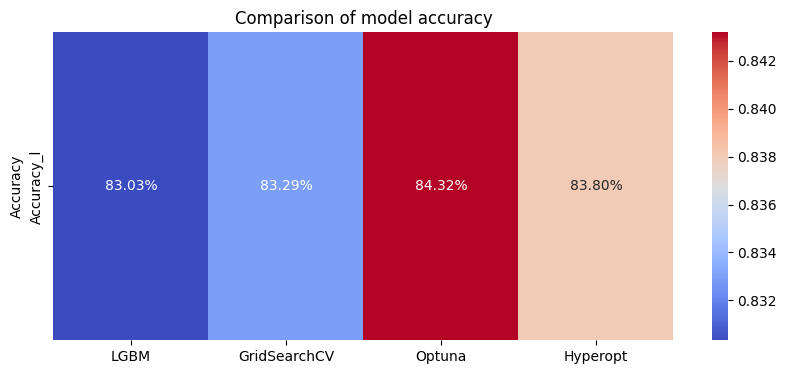

In [66]:
plt.figure(figsize=(10, 4))
sns.heatmap(results[['Accuracy_l']].T, annot=True, cmap='coolwarm', fmt=".2%", cbar=True, xticklabels=results['Model_l'])
plt.title('Comparison of model accuracy')
plt.ylabel('Accuracy')
plt.show()